In [92]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [93]:
%matplotlib inline

In [94]:
import sys
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import mne 
from tqdm import tqdm
import scipy.signal as sp_signal
from sktime.libs.vmdpy import VMD
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN
from sklearn.mixture import GaussianMixture
from scipy.signal import periodogram
from scipy.signal import iirnotch, filtfilt, welch
from sklearn.metrics import silhouette_score
from scipy.stats import pearsonr
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import linkage, dendrogram
from pymultifracs.viz import plot_psd
from pymultifracs import mfa, wavelet_analysis
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.spatial.distance import squareform
import networkx as nx

from scipy.cluster.hierarchy import linkage, fcluster
from scipy.spatial.distance import squareform
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), "..", "scripts")))
from decomposition import run_all_decompositions
from plotting import plot_signal_and_modes
from features import compute_features_from_modes_and_save
from mfa_utils import compute_mfa, plot_mfa, plot_psd, analyze_signal_and_modes, mfa_on_envelope_centroids
from extract_envelopes import extract_envelopes_modes


In [95]:
%matplotlib inline

In [96]:
# Load results
modes_df = pd.read_pickle("../results/real/benchmark/VMD_modes_df_with_enveloppes_channels.pkl")
features_df = pd.read_csv("../results/real/benchmark/features_df_kmeans.csv")

In [97]:
def load_signal(path):
    raw = mne.io.read_raw_fif(path, preload=True)
    raw_meg = raw.copy().pick('meg')
    data = raw_meg.get_data(return_times=False)
    return raw_meg, data

raw, data_matrix = load_signal("../data/sub-01_ses-01_task-rest_proc-filt_raw.fif")

Opening raw data file ../data/sub-01_ses-01_task-rest_proc-filt_raw.fif...
    Range : 34500 ... 116999 =    138.000 ...   467.996 secs
Ready.
Reading 0 ... 82499  =      0.000 ...   329.996 secs...


In [98]:
# Parameters
fs = 250  # Sampling frequency (Hz)
duration = 300.0  # Duration to plot (s)
output_base = "../results/real/"
n_channels_to_process = 306  
n_channels_for_benchmark = 10  # Only for benchmarking
max_points = 1000
methods = ["VMD"]
method = "VMD"
Nmodes = 5

## 1. Signal exploration

In [99]:
raw

<Raw | sub-01_ses-01_task-rest_proc-filt_raw.fif, 306 x 82500 (330.0 s), ~193.1 MiB, data loaded>

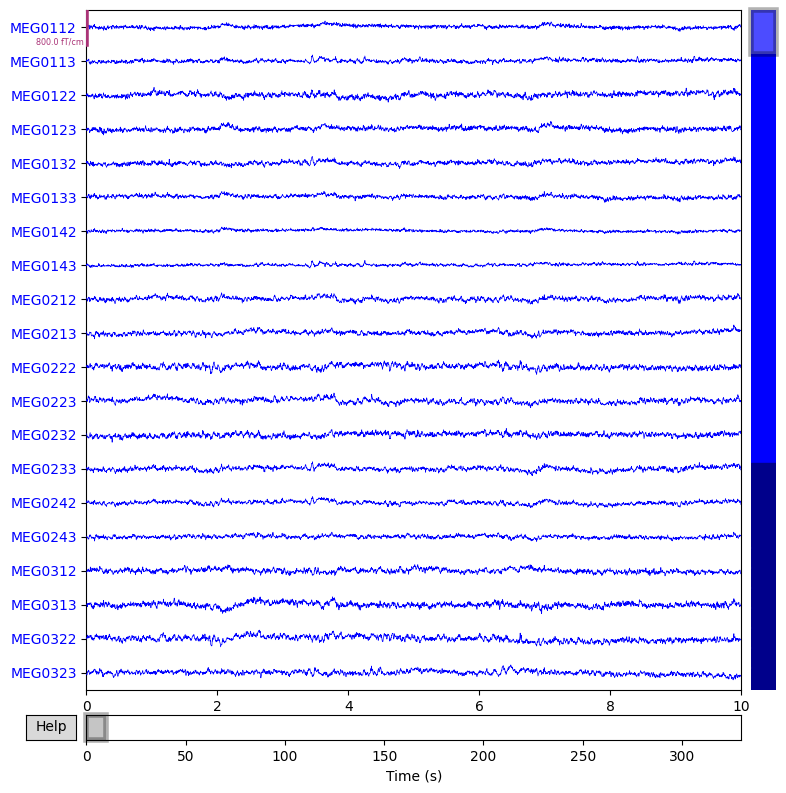

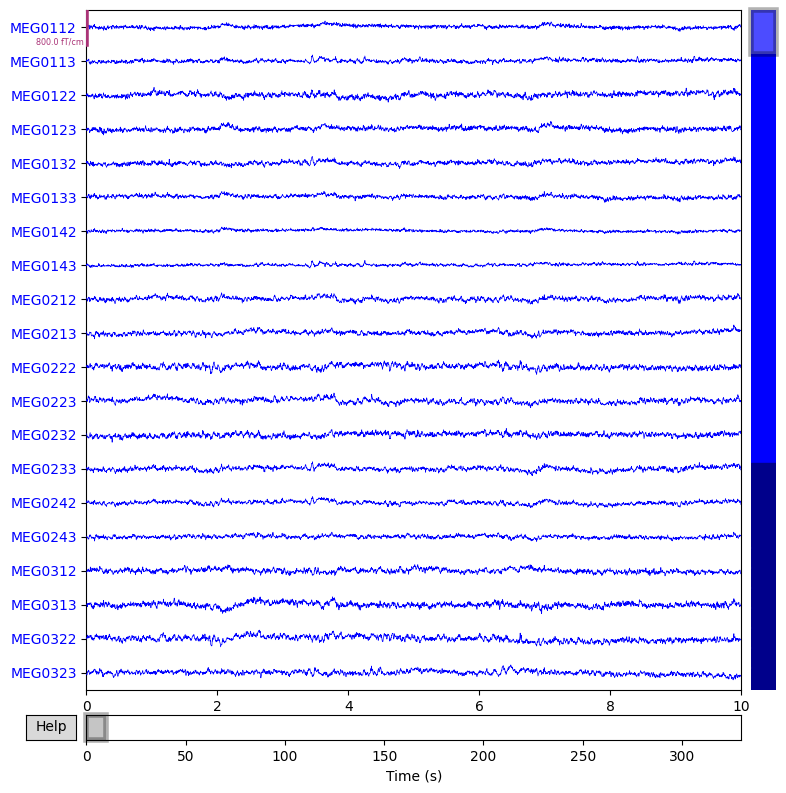

In [100]:
raw.plot()

In [101]:
print(data_matrix.shape)
type(data_matrix)

(306, 82500)


numpy.ndarray

In [102]:
sfreq = raw.info["sfreq"]
sfreq

250.0

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 8.192 (s)
Plotting power spectral density (dB=True).


/opt/homebrew/Caskroom/miniconda/base/envs/mfa-internship/lib/python3.10/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


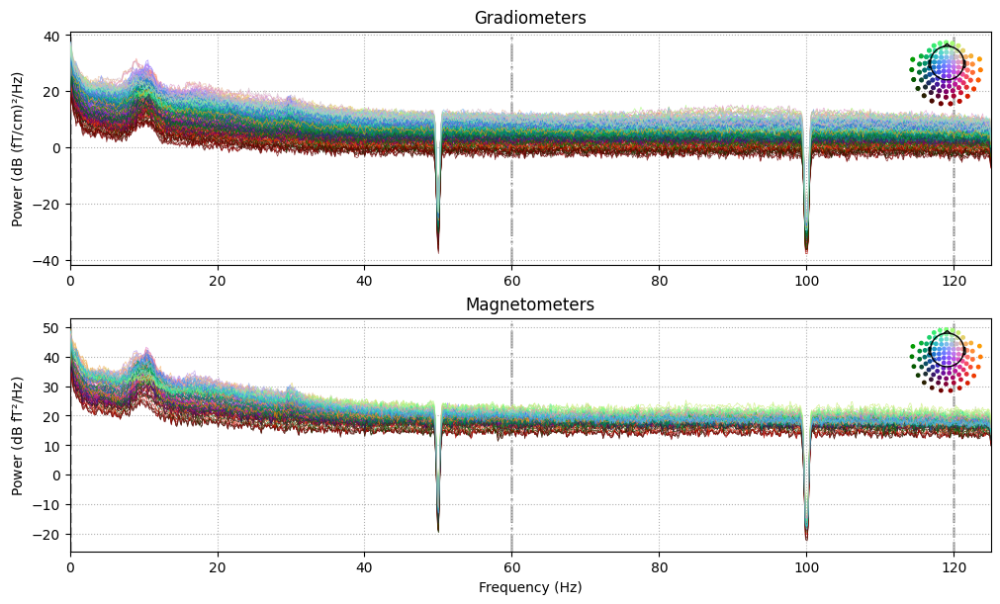

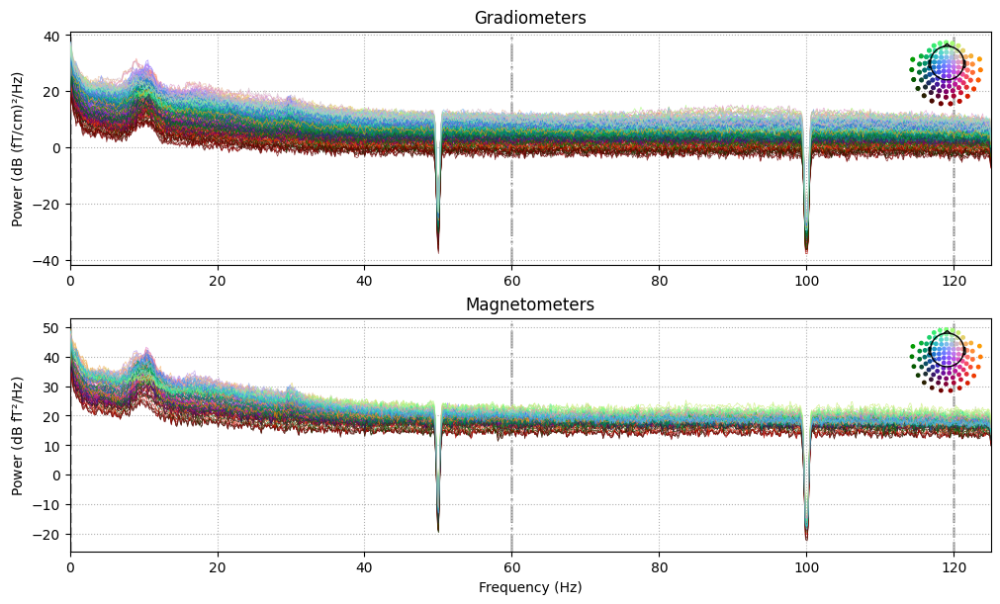

In [103]:
raw.plot_psd()

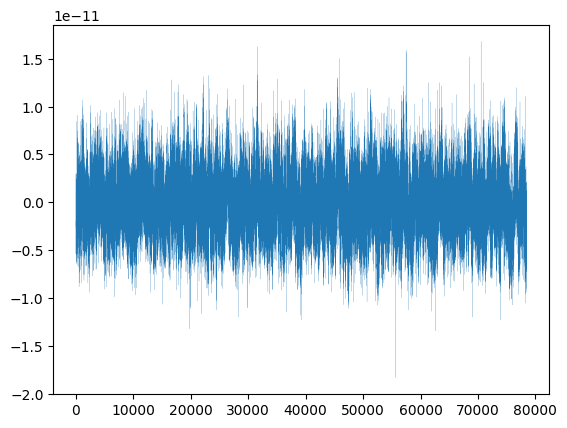

In [104]:
X = data_matrix[2, 2000:-2000]
plt.plot(X, lw=.1)
plt.show()

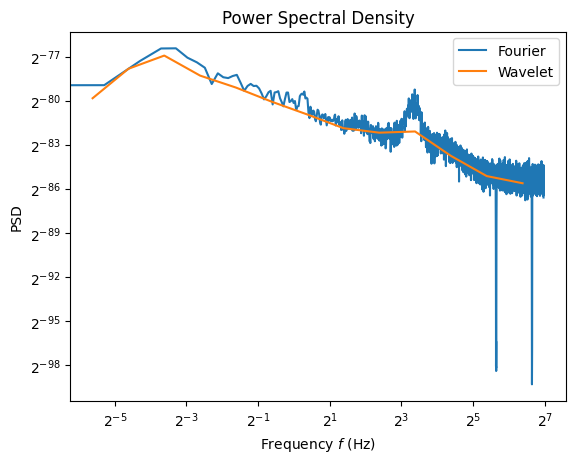

In [105]:
from pymultifracs.viz import plot_psd
plot_psd(X, fs=sfreq)

In [116]:
modes_df

,channel,mode,kmeans_cluster,band,signal,envelope,subgroup,channel_name
0,0,0,2,NotClassified,"[-5.01758334e-14, -5.26101499e-14, -5.03089783...","[2.8177592443329006e-13, 2.8668228597430954e-1...",0,MEG0111
1,0,1,4,Alpha,"[-3.39276335e-14, -3.21253271e-14, -1.89684253...","[2.7250890927819998e-14, 2.785742239335394e-14...",0,MEG0111
2,0,2,5,Low Gamma,"[6.95204261e-14, -1.86157928e-14, -7.94430543e...","[1.455957703064348e-14, 1.4221803056003645e-14...",0,MEG0111
3,0,3,3,Low Gamma,"[9.05414761e-15, -2.01924152e-14, 3.79853736e-15]","[7.575783469990257e-15, 9.673184792539592e-15,...",0,MEG0111
4,0,4,0,High Gamma,"[-6.99557839e-15, 1.55628864e-14, -4.7889929e-14]","[2.1089726569995594e-14, 2.706956615900538e-14...",0,MEG0111
...,...,...,...,...,...,...,...,...
1525,305,0,2,NotClassified,"[-2.10789416e-12, -2.09099555e-12, -1.98695899...","[2.647952165276244e-12, 2.6509521500742433e-12...",0,MEG2643
1526,305,1,4,Alpha,"[1.73103677e-12, 1.68026477e-12, 1.64085297e-12]","[1.1040721620501218e-12, 1.1338227061573817e-1...",0,MEG2643
1527,305,2,5,Low Gamma,"[-1.07745082e-12, -6.958314e-13, 3.22233789e-13]","[5.277677441682242e-13, 5.456402457457698e-13,...",34,MEG2643
1528,305,3,3,Low Gamma,"[1.08403568e-12, -2.33141667e-12, 7.72909003e-13]","[7.68164658969943e-13, 8.532404586736608e-13, ...",119,MEG2643


In [121]:
X = modes_df.loc[4,"envelope"]

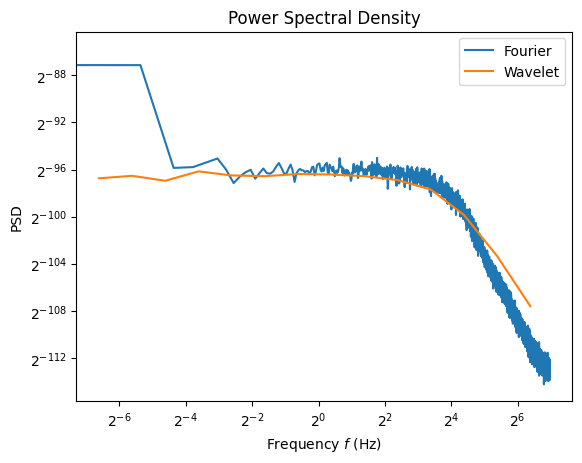

In [122]:
plot_psd(X, fs=250)

In [106]:
WT = wavelet_analysis(X, 'db6').integrate(1)

In [107]:
WT.freq2scale(2.0, sfreq)
WT.scale2freq(9, sfreq)

np.float64(0.35511363636363635)

In [108]:
dwt = mfa(WT, [(6, 11)])

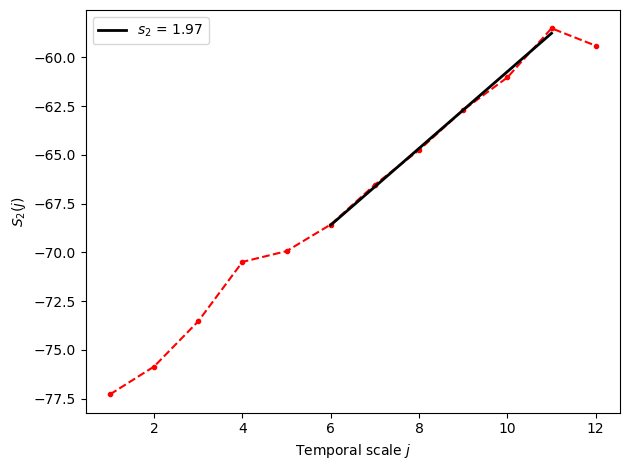

In [109]:
dwt.structure.plot()

In [110]:
H = float(dwt.structure.H.squeeze())

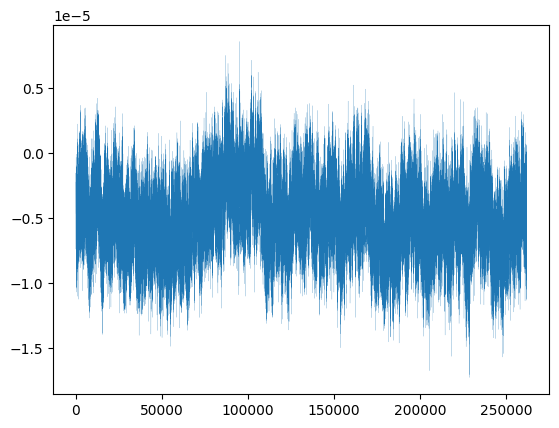

In [111]:
from pymultifracs.simul import fbm
Y = fbm(shape=(2 ** 18), H=H)
plt.plot(np.diff(Y), lw=.1)

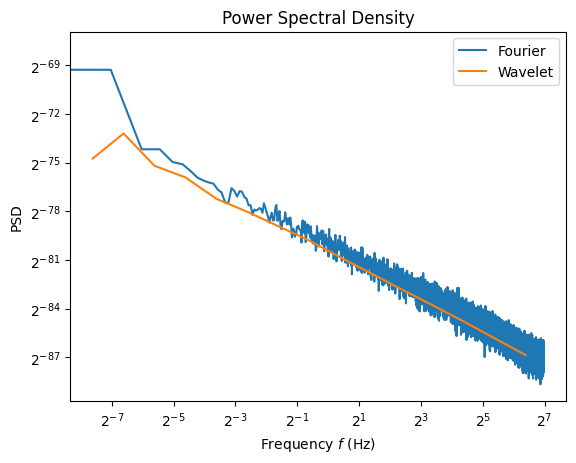

In [112]:
from pymultifracs.viz import plot_psd
plot_psd(np.diff(Y) / np.diff(Y).std() * X.std(), sfreq)


(1.6155871338926322e-27, 1.0587911840678754e-22)

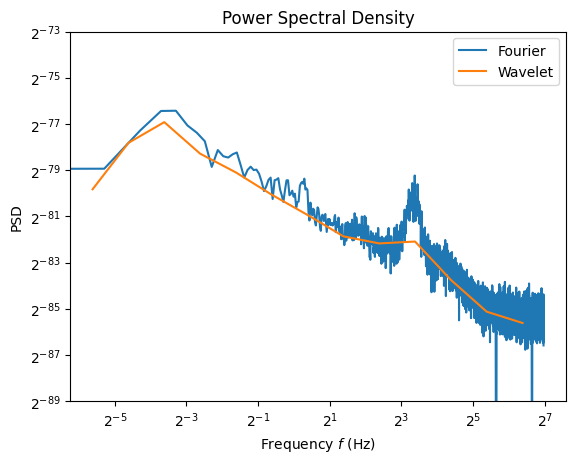

In [113]:
plot_psd(X, sfreq)
plt.ylim(2**-89,2**-73)

## 2. Signal decomposition

### 2.1 Run Benchmark:

In [ ]:
def spectral_overlap_index(mode1, mode2, fs):
    """Compute spectral overlap index between two modes."""
    f1, Pxx1 = periodogram(mode1, fs=fs)
    f2, Pxx2 = periodogram(mode2, fs=fs)
    if not np.allclose(f1, f2):
        raise ValueError("Frequency bins do not match.")
    num = np.sum(np.minimum(Pxx1, Pxx2))
    den = min(np.sum(Pxx1), np.sum(Pxx2))
    return 0.0 if den == 0 else num / den

def compute_soi_matrix(modes, fs):
    """Compute full SOI matrix and return mean off-diagonal value."""
    K = len(modes)
    soi = np.zeros((K, K))
    for i in range(K):
        for j in range(K):
            soi[i, j] = spectral_overlap_index(modes[i], modes[j], fs)
    mean_soi = np.mean(soi[np.triu_indices(K, k=1)])
    return soi, mean_soi

def benchmark_vmd(signal, fs, param_grid):
    results = []
    spectra = {}
    for params in tqdm(param_grid, desc="Benchmarking VMD"):
        Nm = params['Nmodes']
        alpha = params['alpha']
        tau = params['tau']
        DC = params.get('DC', 0)
        init = params.get('init', 1)
        tol = params.get('tol', 1e-6)

        modes, _, _ = VMD(signal, alpha, tau, Nm, DC, init, tol)
        reconstructed = np.sum(modes, axis=0)
        mae = mean_absolute_error(signal, reconstructed)
        _, mean_soi = compute_soi_matrix(modes, fs)

        results.append({
            "alpha": alpha, "tau": tau, "K": Nm, "DC": DC, "init": init, "tol": tol,
            "MAE": mae, "mean_soi": mean_soi,
        })
        spectra[(alpha, tau, Nm)] = modes

    return pd.DataFrame(results), spectra

In [ ]:
# Build parameter grid
alphas = [0, 200, 500, 1000, 5000, 10000, 100000, 1000000]
taus = [0, 0.5, 1]
Nmodes_list = [4, 5, 6]
param_grid = [
    {'Nmodes': k, 'alpha': a, 'tau': t, 'DC': 1, 'init': 1, 'tol': 1e-6}
    for k, a, t in product(Nmodes_list, alphas, taus)
]

all_results = []

# Loop over MEG channels
for ch in range(n_channels_for_benchmark):
    sig = data_matrix[ch]
    sig = (sig - np.mean(sig)) / np.std(sig)  # Standardize

    print(f"\nBenchmarking channel {ch}")
    df_results, _ = benchmark_vmd(sig, fs, param_grid)
    df_results["channel"] = ch
    all_results.append(df_results)

# Save results
df_all = pd.concat(all_results, ignore_index=True)
df_all.to_csv("benchmark_vmd_first10_channels.csv", index=False)
print("✅ Results saved to benchmark_vmd_first10_channels.csv")


Results saved to benchmark_vmd_first10_channels.csv


In [ ]:
# Compute a global score as the sum of MAE and mean_soi
df_all["score"] = df_all["MAE"] + df_all["mean_soi"]

# Filter out alpha = 0 (non-valid configuration)
df_all = df_all[df_all["alpha"] != 0]

# Select best configuration (lowest score) for each channel
best_per_channel = (
    df_all.loc[df_all.groupby("channel")["score"].idxmin()]
    .sort_values("channel")
    .reset_index(drop=True)
)

display(best_per_channel)

# Select top 5 best global (alpha, tau) combinations
agg = (
    df_all.groupby(["alpha", "tau"])
    .agg(
        mean_MAE=("MAE", "mean"),
        mean_soi=("mean_soi", "mean"),
        score=("score", "mean"),
        n_channels=("channel", "nunique"),
    )
    .reset_index()
    .sort_values("score")
    .head(5)
)

display(agg)

In [ ]:
# display(best_per_channel)
# display(agg)

,alpha,tau,K,DC,init,tol,MAE,mean_soi,channel,score
0,200,1.0,6,1,1,0.000001,0.000293,0.019646,0,0.019939
1,200,1.0,6,1,1,0.000001,0.001626,0.020041,1,0.021667
2,200,0.5,6,1,1,0.000001,0.000243,0.020650,2,0.020894


,alpha,tau,mean_MAE,mean_soi,score,n_channels
2,200,1.0,0.000721,0.027596,0.028317,3
1,200,0.5,0.006384,0.028292,0.034676,3
5,500,1.0,0.050777,0.027259,0.078036,3
4,500,0.5,0.078541,0.024045,0.102587,3
0,200,0.0,0.088308,0.020869,0.109177,3


### 2.2 Run the Decompositions:

In [ ]:
# VMD configuration
max_modes = 5
method = "VMD"

best_vmd_params = {
    'meg': {
        'vmd_alpha': 200,
        'vmd_tau': 0.5,
        'vmd_DC': 1,
        'vmd_init': 0,
        'vmd_tol': 1e-7,
        'Nmodes': max_modes
    },
}

# Loop over MEG channels to decompose
for ch_idx in range(n_channels_to_process):
    signal = data_matrix[ch_idx, :]

    # Standardize the signal
    signal_scaled = (signal - np.mean(signal)) / np.std(signal)

    name = f"meg_channel_{ch_idx}"
    output_dir = os.path.join(output_base, name)
    os.makedirs(output_dir, exist_ok=True)

    # Get decomposition parameters
    params = best_vmd_params['meg']

    # Run EMD/VMD decomposition
    modes_dict = run_all_decompositions(
        signal_in=signal_scaled,
        methods=methods,
        Fs=fs,
        Nmodes=params['Nmodes'],
        MaxEmdIMF=max_modes,
        MaxVmdModes=max_modes,
        vmd_alpha=params['vmd_alpha'],
        vmd_tau=params['vmd_tau'],
        vmd_DC=params['vmd_DC'],
        vmd_init=params['vmd_init'],
        vmd_tol=params['vmd_tol'],
        return_modes=True
    )
    # Rescale modes back to original signal scale
    for method in modes_dict:
        modes_dict[method] = modes_dict[method] * std + mean

    # Save decomposed modes
    for method in methods:
        method_dir = os.path.join(output_dir, method)
        os.makedirs(os.path.join(method_dir, "modes"), exist_ok=True)

        out_path = os.path.join(method_dir, "modes", f"{name}_modes.npy")
        np.save(out_path, modes_dict[method])
        print(f"Saved modes for {method} - {name}")


In [ ]:
# Extract features from decomposed modes
for ch_idx in range(n_channels_to_process):
    name = f"meg_channel_{ch_idx}"
    output_dir = os.path.join(output_base, name)
    
    for method in methods:
        modes_path = os.path.join(output_dir, method, "modes", f"{name}_modes.npy")
        features_path = os.path.join(output_dir, method, "features", f"{name}_features.csv")

        compute_features_from_modes_and_save(modes_path, features_path, fs)
        print(f"Features saved for {method} - {name}")


Features saved to ../results/real/meg_channel_0/VMD/features/meg_channel_0_std_features.csv
Features saved for VMD of meg_channel_0
Features saved to ../results/real/meg_channel_1/VMD/features/meg_channel_1_std_features.csv
Features saved for VMD of meg_channel_1
Features saved to ../results/real/meg_channel_2/VMD/features/meg_channel_2_std_features.csv
Features saved for VMD of meg_channel_2
Features saved to ../results/real/meg_channel_3/VMD/features/meg_channel_3_std_features.csv
Features saved for VMD of meg_channel_3
Features saved to ../results/real/meg_channel_4/VMD/features/meg_channel_4_std_features.csv
Features saved for VMD of meg_channel_4
Features saved to ../results/real/meg_channel_5/VMD/features/meg_channel_5_std_features.csv
Features saved for VMD of meg_channel_5
Features saved to ../results/real/meg_channel_6/VMD/features/meg_channel_6_std_features.csv
Features saved for VMD of meg_channel_6
Features saved to ../results/real/meg_channel_7/VMD/features/meg_channel_7_s

In [ ]:
# Plot original signal + decomposed modes
for ch_idx in range(n_channels_to_process):
    signal = data_matrix[ch_idx, :] 
    name = f"meg_channel_{ch_idx}"
    output_dir = os.path.join(output_base, name)

    for method in methods:
        modes_path = os.path.join(output_dir, method, "modes", f"{name}_std_modes.npy")
        
        if not os.path.exists(modes_path):
            print(f"Modes not found for {method} - {name}, skipping.")
            continue
        
        modes = np.load(modes_path)

        plot_signal_and_modes(
            x=signal,
            sfreq=fs,
            modes=modes,
            method=method,
            ch=ch_idx,
            output_dir=output_dir,
            duration=duration,             
            max_points=max_points,        
            spectrum_method='psd' 
        )
        print(f"Plots saved for {method} - {name}")


### 2.3 Analyze the Results:

##### Step 1: Compute Correlation Matrix Between Modes (Per Channel)


In [204]:
def plot_mode_corr_matrix_vmd(
    corr_matrix,
    title="Average Correlation Between VMD Modes",
    cmap="mako",
    figsize=(7, 6),
    mode_names=None,
    fontsize=12,
):
    """
    Plot a clean Seaborn heatmap of the VMD mode correlation matrix.

    Parameters:
    - corr_matrix: square (n_modes x n_modes) matrix
    - title: title of the plot
    - cmap: color palette
    - figsize: figure size
    - mode_names: optional list of labels (e.g., ["Delta", "Theta", ...])
    - fontsize: font size for labels and annotations
    """
    n_modes = corr_matrix.shape[0]
    if mode_names is None:
        mode_names = [f"Mode {i+1}" for i in range(n_modes)]

    plt.figure(figsize=figsize)
    ax = sns.heatmap(
        corr_matrix,
        annot=True,
        fmt=".2f",
        cmap=cmap,
        square=True,
        xticklabels=mode_names,
        yticklabels=mode_names,
        linewidths=0.5,
        linecolor='white',
        cbar_kws={"label": "Correlation"},
        vmin=0, vmax=1
    )

    ax.set_title(title, fontsize=fontsize + 2, weight='bold', pad=20)
    ax.set_xlabel("Mode Indexes", fontsize=fontsize)
    ax.set_ylabel("Mode Indexes", fontsize=fontsize)
    ax.tick_params(axis='both', labelsize=fontsize)
    plt.tight_layout()
    plt.show()


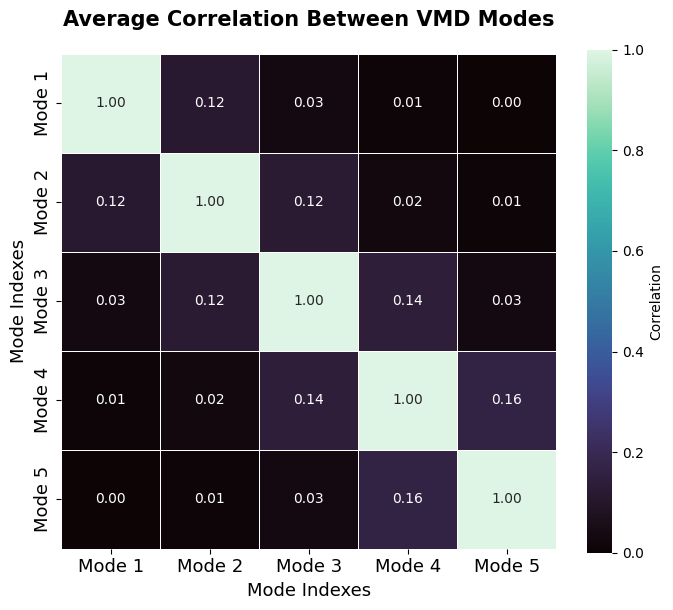

In [205]:
plot_mode_corr_matrix_vmd(
    avg_corr,
    title="Average Correlation Between VMD Modes",
    cmap="mako",  # or "plasma", "viridis", "coolwarm"
    mode_names=[f"Mode {i+1}" for i in range(avg_corr.shape[0])],
    fontsize=13
)


##### Step 2: Assign Modes to Physiological Frequency Bands

In [19]:
# Frequency band classifier
def get_band(freq):
    if 1 <= freq < 4:
        return "Delta"
    elif 4 <= freq < 8:
        return "Theta"
    elif 8 <= freq < 13:
        return "Alpha"
    elif 13 <= freq < 30:
        return "Beta"
    elif 30 <= freq < 80:
        return "Low Gamma"
    elif freq >= 80:
        return "High Gamma"
    return "NotClassified"

In [26]:
# Rebuild Full Feature DataFrame and Annotate Bands
all_rows = []

for ch in range(n_channels_to_process):
    name = f"meg_channel_{ch}"
    feat_path = os.path.join(output_base, name, method, "features", f"{name}_features.csv")
    mode_path = os.path.join(output_base, name, method, "modes", f"{name}_modes.npy")
    
    if not os.path.exists(feat_path) or not os.path.exists(mode_path):
        continue

    df = pd.read_csv(feat_path)
    modes = np.load(mode_path)

    for mode_idx in range(Nmodes):
        row = [ch, mode_idx]
        features = [
            df[f"{col}{mode_idx}"].iloc[0]
            for col in ["AM", "BM", "ent", "pow", "Cent", "Ppeak", "Pfreq", "skew", "kurt", "Hmob", "Hcomp"]
        ]
        band = get_band(features[6])  # Ppeak is at index 6
        all_rows.append(row + features + [band])

# Final feature DataFrame with bands
columns = ["channel", "mode", "AM", "BM", "ent", "pow", "Cent", "Ppeak", "Pfreq", 
           "skew", "kurt", "Hmob", "Hcomp", "band"]

features_df = pd.DataFrame(all_rows, columns=columns)

In [27]:
features_df["band"].value_counts()

band
Low Gamma        509
High Gamma       322
NotClassified    306
Alpha            305
Beta              88
Name: count, dtype: int64

##### STEP 3: K-means Clustering

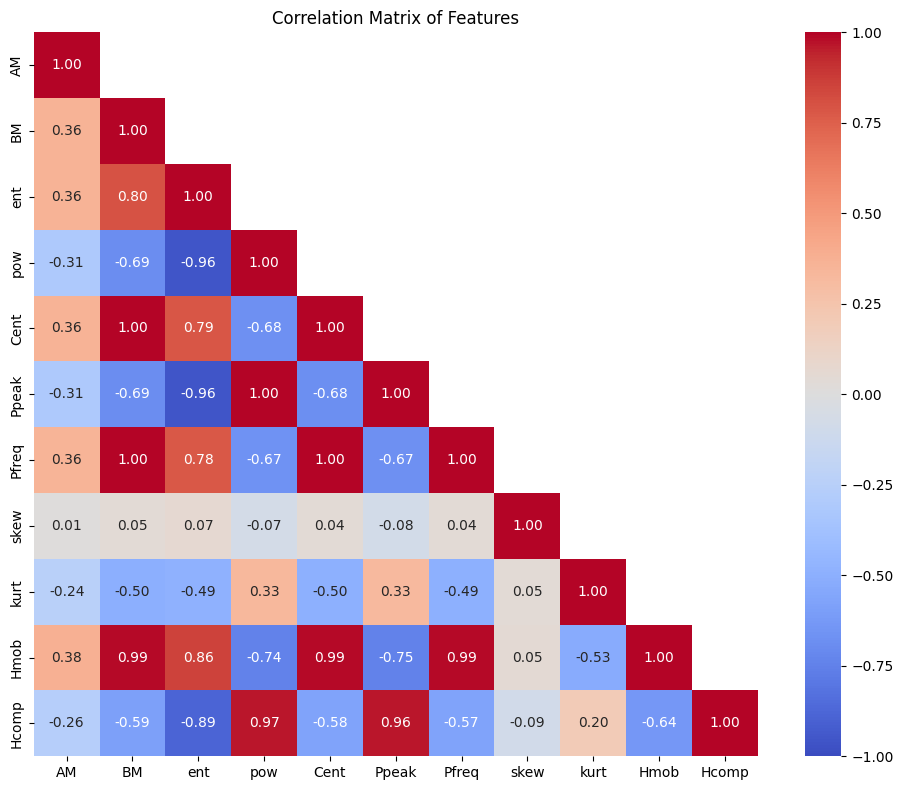

In [28]:
# Visualize Feature Correlation Matrix between the features before clustering

features_to_drop = ["channel", "mode", "band"]
X = features_df.drop(columns=features_to_drop)

corr = X.corr()
mask = np.triu(np.ones_like(corr, dtype=bool), k=1)

plt.figure(figsize=(10, 8))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt=".2f", cmap="coolwarm", mask=mask, square=True)
plt.title("Correlation Matrix of Features")
plt.tight_layout()
plt.show()

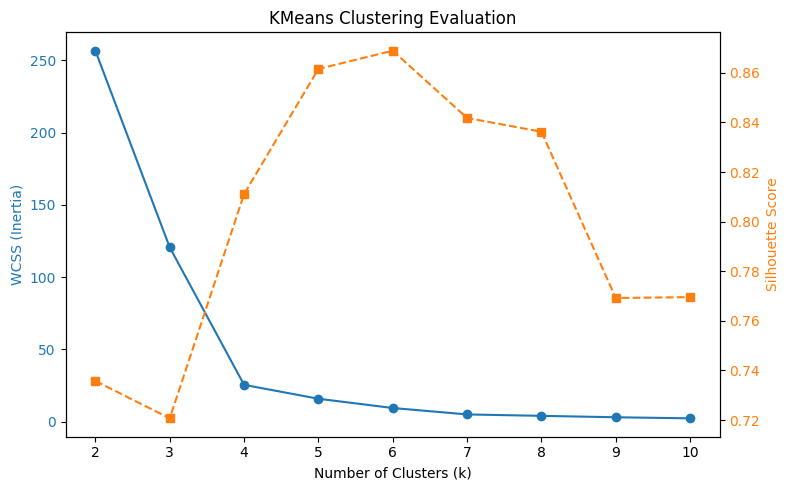

In [30]:
# Clustering - Determine Optimal Number of Clusters


k_range = range(2, 11)
wcss = []
silhouette_scores = []

for k in k_range:
    model = KMeans(n_clusters=k, random_state=0)
    labels = model.fit_predict(X_scaled)
    wcss.append(model.inertia_)
    silhouette_scores.append(silhouette_score(X_scaled, labels))

# Plot WCSS and Silhouette Scores
fig, ax1 = plt.subplots(figsize=(8, 5))

color1 = 'tab:blue'
ax1.plot(k_range, wcss, marker='o', color=color1)
ax1.set_xlabel('Number of Clusters (k)')
ax1.set_ylabel('WCSS (Inertia)', color=color1)
ax1.tick_params(axis='y', labelcolor=color1)
ax1.set_title("KMeans Clustering Evaluation")

ax2 = ax1.twinx()
color2 = 'tab:orange'
ax2.plot(k_range, silhouette_scores, marker='s', linestyle='--', color=color2)
ax2.set_ylabel('Silhouette Score', color=color2)
ax2.tick_params(axis='y', labelcolor=color2)

plt.tight_layout()
plt.show()


In [ ]:
# PCA TO RUN ONLY IF MORE THAN ONE FEATURES IS USED FOR KMEANS
# pca = PCA(n_components=2)
# proj = pca.fit_transform(X_scaled)
# features_df["PC1"] = proj[:, 0]
# features_df["PC2"] = proj[:, 1]

In [31]:
# KMeans Clustering
kmeans = KMeans(n_clusters=6,init='k-means++',   random_state=42, n_init=100)
features_df["kmeans_cluster"] = kmeans.fit_predict(X_scaled)

# DBSCAN Clustering (Optional Tuning Needed)
dbscan = DBSCAN(eps=0.85, min_samples=50)
features_df["dbscan_cluster"] = dbscan.fit_predict(X_scaled)

# MixtureGaussian Clustering
gaussianmixture = GaussianMixture(n_components=6 , init_params="k-means++")
features_df["gm_cluster"] = gaussianmixture.fit_predict(X_scaled)

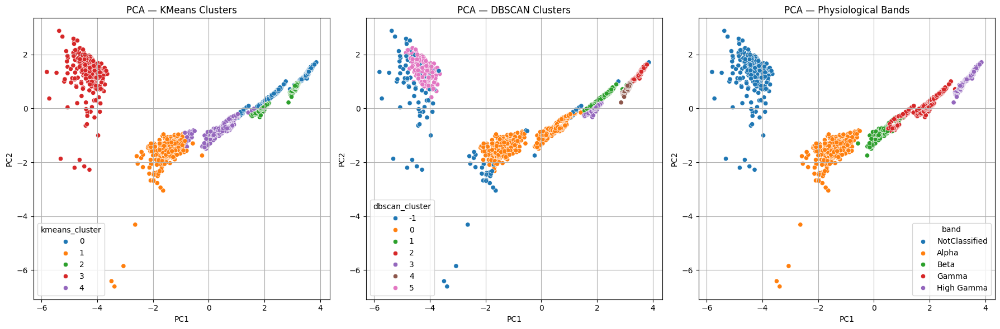

In [ ]:
#### TO RUN ONLY IF KMEANS ON MANY FEATURES + PCA

# fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# sns.scatterplot(data=features_df, x="PC1", y="PC2", hue="kmeans_cluster", palette="tab10", ax=axs[0])
# axs[0].set_title("PCA — KMeans Clusters")

# sns.scatterplot(data=features_df, x="PC1", y="PC2", hue="dbscan_cluster", palette="tab10", ax=axs[1])
# axs[1].set_title("PCA — DBSCAN Clusters")

# sns.scatterplot(data=features_df, x="PC1", y="PC2", hue="band", palette="tab10", ax=axs[2])
# axs[2].set_title("PCA — Physiological Bands")

# for ax in axs:
#     ax.grid(True)
# plt.tight_layout()
# plt.show()

In [114]:
features_df

,channel,mode,AM,BM,ent,pow,Cent,Ppeak,Pfreq,skew,kurt,Hmob,Hcomp,band,kmeans_cluster,dbscan_cluster,gm_cluster
0,0,0,1.619430e+16,2.429728e+07,3.818828,0.000231,1.369039,0.243514,0.244141,-0.399276,1.123100,0.054765,11.003011,NotClassified,2,0,0
1,0,1,4.457804e+16,2.854323e+08,5.658255,0.000061,12.134132,0.064026,10.253906,0.006512,0.358334,0.320878,1.336926,Alpha,4,0,4
2,0,2,1.773910e+17,9.454348e+08,7.157653,0.000016,40.268168,0.013087,37.597656,-0.002142,0.083966,0.981706,1.073465,Low Gamma,5,0,3
3,0,3,1.948175e+17,1.800733e+09,7.260703,0.000014,76.649285,0.010912,76.904297,0.001041,-0.002774,1.636510,1.012601,Low Gamma,3,0,5
4,0,4,2.052032e+17,2.465257e+09,7.098242,0.000015,109.202626,0.010984,108.886719,0.000318,0.095243,1.949135,1.001407,High Gamma,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1525,305,0,9.890172e+14,2.459465e+07,3.973728,0.000209,1.529659,0.227463,0.244141,-0.512417,2.276634,0.057407,10.562792,NotClassified,2,0,0
1526,305,1,2.496072e+15,2.911765e+08,5.840269,0.000049,12.386702,0.049080,10.986328,0.058449,0.821177,0.328066,1.334098,Alpha,4,0,4
1527,305,2,9.336636e+15,9.687155e+08,7.143784,0.000016,41.294795,0.012866,42.236328,0.000890,0.026369,1.003138,1.067189,Low Gamma,5,0,3
1528,305,3,1.087823e+16,1.775044e+09,7.268588,0.000014,75.665607,0.011586,77.636719,-0.014103,0.018117,1.622310,1.013238,Low Gamma,3,0,5


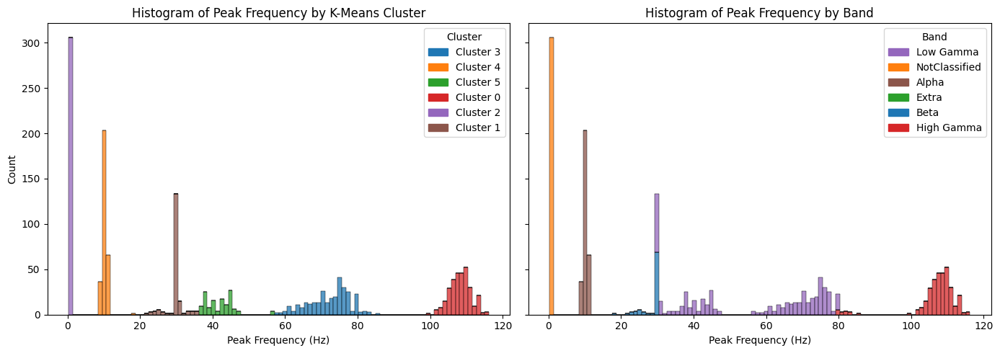

In [33]:
from matplotlib.patches import Patch

# Prepare color palette
colors = sns.color_palette("tab10", n_colors=6)

# Define custom cluster order (from lowest to highest peak frequency)
cluster_order = [3, 4, 5, 0, 2, 1]

# Map cluster ID to color in this order
cluster_palette = {cluster_id: colors[i] for i, cluster_id in enumerate(cluster_order)}

# Optional: Define band → cluster mapping if known
band_to_cluster = {
    'Low Gamma': 2,
    'NotClassified': 4,
    'Alpha': 1,
    'Extra': 5,  # Replace or rename if needed
    'Beta': 3,
    'High Gamma': 0,
}

# Map bands to same colors as their matching cluster
band_palette = {band: cluster_palette[cluster] for band, cluster in band_to_cluster.items()}

# Plot histograms
fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=True)

# ==== (a) Histogram by K-Means Cluster ====
sns.histplot(
    data=features_df,
    x='Pfreq',
    hue='kmeans_cluster',
    hue_order=cluster_order,
    bins=100,
    palette=cluster_palette,
    multiple='stack',
    ax=axes[0]
)
axes[0].set_title("Histogram of Peak Frequency by K-Means Cluster")
axes[0].set_xlabel("Peak Frequency (Hz)")
axes[0].set_ylabel("Count")

# Custom legend for clusters
cluster_legend = [
    Patch(color=cluster_palette[cl], label=f"Cluster {cl}")
    for cl in cluster_order
]
axes[0].legend(handles=cluster_legend, title="Cluster", loc='upper right')

# ==== (b) Histogram by Physiological Band ====
band_order = list(band_palette.keys())  # Preserve your band order

sns.histplot(
    data=features_df,
    x='Pfreq',
    hue='band',
    hue_order=band_order,
    bins=100,
    palette=band_palette,
    multiple='stack',
    ax=axes[1]
)
axes[1].set_title("Histogram of Peak Frequency by Band")
axes[1].set_xlabel("Peak Frequency (Hz)")
axes[1].set_ylabel("Count")

# Custom legend for bands
band_legend = [
    Patch(color=band_palette[band], label=band)
    for band in band_order
]
axes[1].legend(handles=band_legend, title="Band", loc='upper right')

plt.tight_layout()
plt.show()


In [34]:
# Moyenne de fréquence de pic par cluster
avg_freq = features_df.groupby("kmeans_cluster")["Pfreq"].mean().sort_values()
print("Average Peak Frequency per Cluster:")
print(avg_freq)


Average Peak Frequency per Cluster:
kmeans_cluster
2      0.244141
4     10.348052
1     29.738783
5     41.941868
3     72.253499
0    108.251634
Name: Pfreq, dtype: float64


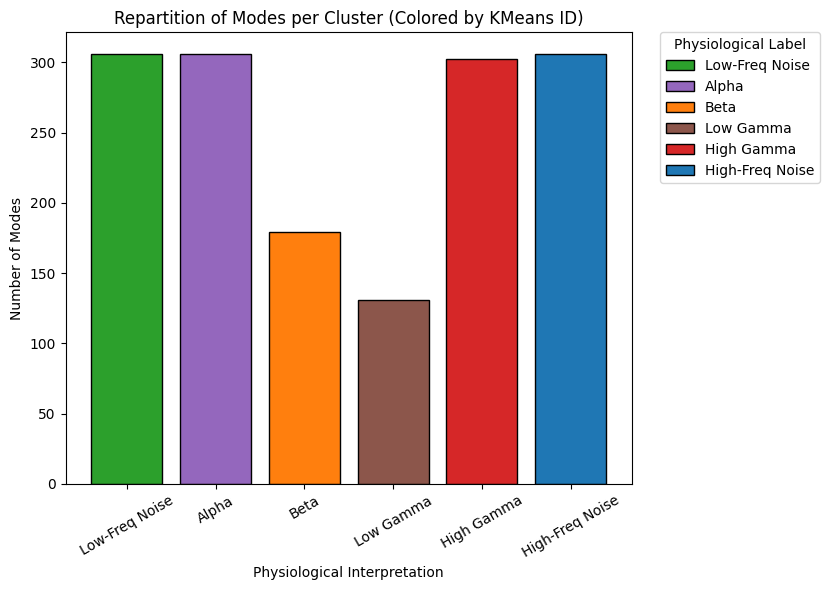

In [35]:
# Frequencies per cluster from earlier results
cluster_peak_freq = {
    2: 0.24,
    4: 10.35,
    1: 29.74,
    5: 41.94,
    3: 72.25,
    0: 108.25
}

# Cluster ID → Physiological label
def label_band(cluster_id):
    f = cluster_peak_freq[cluster_id]
    if f < 1:
        return "Low-Freq Noise"
    elif 1 <= f < 13:
        return "Alpha"
    elif 13 <= f < 30:
        return "Beta"
    elif 30 <= f < 60:
        return "Low Gamma"
    elif 60 <= f <= 100:
        return "High Gamma"
    else:
        return "High-Freq Noise"

# Desired order of bands on x-axis and in legend
band_order = [
    "Low-Freq Noise",
    "Alpha",
    "Beta",
    "Low Gamma",
    "High Gamma",
    "High-Freq Noise"
]

# Generate cluster ID → color mapping using tab10 palette
cluster_ids = sorted(cluster_peak_freq.keys())  # [0, 1, 2, 3, 4, 5]
colors = sns.color_palette("tab10", n_colors=len(cluster_ids))
cluster_color_map = dict(zip(cluster_ids, colors))

# Count number of modes per cluster
counts = features_df["kmeans_cluster"].value_counts().sort_index()

# Store (count, color, cluster_id) for each label
label_info = {}
for cluster_id in counts.index:
    label = label_band(cluster_id)
    color = cluster_color_map[cluster_id]
    count = counts[cluster_id]
    label_info[label] = (count, color, cluster_id)

# === PLOT ===
plt.figure(figsize=(10, 6))

for label in band_order:
    if label in label_info:
        count, color, cluster_id = label_info[label]
        plt.bar(label, count, color=color, edgecolor='black', label=f"{label}")

# Custom legend (right side)
handles, labels = plt.gca().get_legend_handles_labels()
unique = dict(zip(labels, handles))
plt.legend(
    unique.values(),
    unique.keys(),
    title="Physiological Label",
    bbox_to_anchor=(1.05, 1),
    loc='upper left',
    borderaxespad=0.
)

# Final formatting
plt.ylabel("Number of Modes")
plt.xlabel("Physiological Interpretation")
plt.title("Repartition of Modes per Cluster (Colored by KMeans ID)")
plt.xticks(rotation=30)
plt.tight_layout(rect=[0, 0, 0.85, 1])
plt.show()


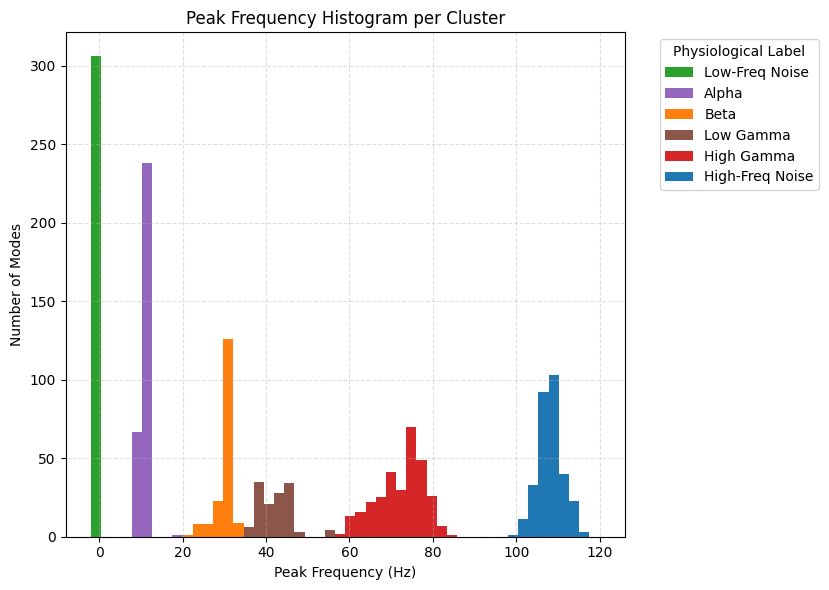

In [36]:
# === Frequencies per cluster
cluster_peak_freq = {
    2: 0.24,
    4: 10.35,
    1: 29.74,
    5: 41.94,
    3: 72.25,
    0: 108.25
}

# === Cluster ID → Physiological label
def label_band(cluster_id):
    f = cluster_peak_freq[cluster_id]
    if f < 1:
        return "Low-Freq Noise"
    elif 1 <= f < 13:
        return "Alpha"
    elif 13 <= f < 30:
        return "Beta"
    elif 30 <= f < 60:
        return "Low Gamma"
    elif 60 <= f <= 100:
        return "High Gamma"
    else:
        return "High-Freq Noise"

# === Legend order (clean)
legend_order = [
    "Low-Freq Noise",
    "Alpha",
    "Beta",
    "Low Gamma",
    "High Gamma",
    "High-Freq Noise"
]

# === Cluster ID → color
cluster_ids = sorted(cluster_peak_freq.keys())
colors = sns.color_palette("tab10", n_colors=len(cluster_ids))
cluster_color_map = dict(zip(cluster_ids, colors))

# === PLOT
plt.figure(figsize=(10, 6))
legend_handles = {}

# Define bin range manually to “cheat” and show low-freq noise
# Add a small margin before 0 to capture the 0.24 Hz bin
bin_min = -2
bin_max = 120
bins = 50
bin_edges = np.linspace(bin_min, bin_max, bins + 1)

for cluster_id in cluster_ids:
    subset = features_df[features_df["kmeans_cluster"] == cluster_id]
    physio_label = label_band(cluster_id)
    full_label = f"{physio_label}"
    color = cluster_color_map[cluster_id]

    plot = sns.histplot(
        data=subset,
        x="Pfreq",
        bins=bin_edges,
        stat="count",
        color=color,
        fill=True,
        alpha=1,
        label=full_label,
        edgecolor=None
    )

    # Save handle for legend
    handle = plot.containers[-1]
    legend_handles[physio_label] = (handle, full_label)

# === Legend ordering
ordered_handles = []
ordered_labels = []
for label in legend_order:
    if label in legend_handles:
        handle, full_label = legend_handles[label]
        ordered_handles.append(handle)
        ordered_labels.append(full_label)

plt.xlabel("Peak Frequency (Hz)")
plt.ylabel("Number of Modes")
plt.title("Peak Frequency Histogram per Cluster")
plt.legend(
    ordered_handles,
    ordered_labels,
    title="Physiological Label",
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)
plt.tight_layout(rect=[0, 0, 0.85, 1])
plt.grid(True, linestyle="--", alpha=0.4)
plt.show()


In [37]:
# KMeans vs. bands
cont_kmeans = pd.crosstab(features_df["kmeans_cluster"], features_df["band"])
display(cont_kmeans)

band,Alpha,Beta,High Gamma,Low Gamma,NotClassified
kmeans_cluster,,,,,
0,0,0,306,0,0
1,0,87,0,92,0
2,0,0,0,0,306
3,0,0,16,286,0
4,305,1,0,0,0
5,0,0,0,131,0


In [39]:
# Save the full features DataFrame with clustering and band labels
output_path = os.path.join(output_base, "features_df_kmeans.csv")
features_df.to_csv(output_path, index=False, encoding='utf-8')
print(f"✅ Saved full features DataFrame with cluster labels to:\n{output_path}")

✅ Saved full features DataFrame with cluster labels to:
../results/real/features_df_kmeans.csv


##### STEP 4: Analyze Clusters

In [233]:
required_cols = ["channel", "mode", "kmeans_cluster", "band", "signal"]

# Load mode signals from saved .npy files and merge with features_df metadata
modes_df = []
n_channels = features_df["channel"].nunique()

for ch in tqdm(range(n_channels), desc="Loading mode files"):
    name = f"meg_channel_{ch}"
    mode_path = os.path.join(output_base, name, method, "modes", f"{name}_modes.npy")
    if not os.path.exists(mode_path):
        print(f"⚠️ File missing: {mode_path}")
        continue

    modes = np.load(mode_path)
    for mode_idx in range(modes.shape[0]):
        match = features_df[(features_df["channel"] == ch) & (features_df["mode"] == mode_idx)]
        if match.empty:
            print(f"⚠️ No match for channel={ch}, mode={mode_idx}")
            continue
        row = match.iloc[0]
        modes_df.append({
            "channel": ch,
            "mode": mode_idx,
            "kmeans_cluster": row["kmeans_cluster"],
            "band": row["band"],
            "signal": modes[mode_idx]
        })

modes_df = pd.DataFrame(modes_df)

Loading mode files: 100%|██████████| 306/306 [00:02<00:00, 108.21it/s]


* Mode 0 -> Cluster 2
* Mode 1 -> Cluster 4
* Mode 2 -> Clusters 1 and 5
* Mode 3 -> Cluster 3 
* Mode 4 -> Cluster 0 

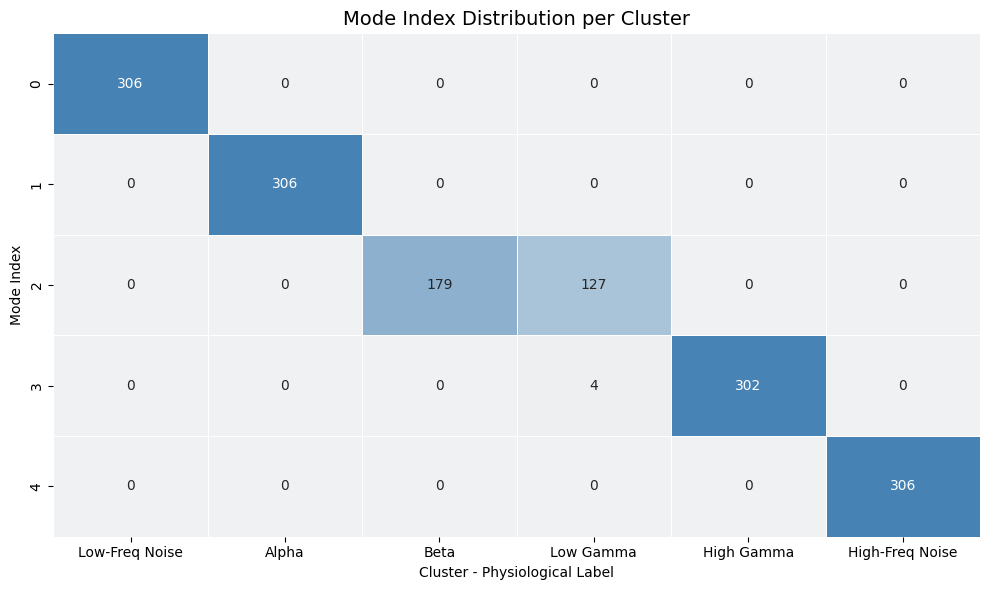

In [ ]:
from matplotlib.colors import ListedColormap

# === 1. Cluster ID → Band label map
cluster_band_map = {
    2: "Low-Freq Noise",
    4: "Alpha",
    1: "Beta",
    5: "Low Gamma",
    3: "High Gamma",
    0: "High-Freq Noise"
}

# === 2. Tab10 color palette
cluster_ids = sorted(cluster_band_map.keys())  # [0, 1, 2, 3, 4, 5]
colors = sns.color_palette("tab10", n_colors=len(cluster_ids))
cluster_color_map = dict(zip(cluster_ids, colors))

# === 3. Mode distribution table
mode_distribution = modes_df.groupby(["mode", "kmeans_cluster"]).size().unstack(fill_value=0)

# Rename columns with physiological labels
mode_distribution.columns = [cluster_band_map[cid] for cid in mode_distribution.columns]

# Reorder columns to match frequency order
band_order = [
    "Low-Freq Noise",
    "Alpha",
    "Beta",
    "Low Gamma",
    "High Gamma",
    "High-Freq Noise"
]
mode_distribution = mode_distribution.reindex(columns=band_order)

# === 4. Create a colormap that mimics tab10 but in Blue ambience
# (You can also create a Blue-gradient ambiance for neutral background)
cmap_blues_custom = sns.light_palette("steelblue", as_cmap=True)  # or "royalblue"

# === 5. Plot the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(
    mode_distribution,
    annot=True,
    fmt="d",
    cmap=cmap_blues_custom,
    cbar = False,
    linewidths=0.5,
    linecolor='white'
)
plt.title("Mode Index Distribution per Cluster", fontsize=14)
plt.xlabel("Cluster - Physiological Label")
plt.ylabel("Mode Index")
plt.tight_layout()
plt.show()


In [19]:
# Group by cluster and compute average peak frequency
avg_pf_per_cluster = (
    features_df
    .groupby("kmeans_cluster")["Pfreq"]
    .mean()
    .sort_values()
)

print("Average Peak Frequency per Cluster (sorted):")
print(avg_pf_per_cluster)

Average Peak Frequency per Cluster (sorted):
kmeans_cluster
2      0.244141
4     10.348052
1     29.738783
5     41.941868
3     72.253499
0    108.251634
Name: Pfreq, dtype: float64


###### Compare Power Spectra of Modes Across Clusters

In [78]:
def double_notch(signal, fs, freqs=[50, 100], Q=30):
    """Apply notch filters at specified frequencies."""
    for f in freqs:
        b, a = iirnotch(f, Q, fs)
        signal = filtfilt(b, a, signal)
    return signal

def plot_cluster_matched_psds(
    features_df,
    output_base,
    method,
    fs,
    custom_order,
    nperseg=1024,
    eps=1e-30,
    log_y=True  # <--- NEW PARAMETER
):
    """
    Plot mean PSD for each (mode, cluster) pair.
    Top: all occurrences of the mode.
    Bottom: only the cluster-matched occurrences.

    If log_y=True, use dB scale (log); else use linear power.
    """
    n_panels = len(custom_order)
    fig, axes = plt.subplots(2, n_panels, figsize=(6 * n_panels, 10), sharex=True, sharey=True)
    if n_panels == 1:
        axes = np.expand_dims(axes, axis=1)

    for i, (cluster_id, mode_id) in enumerate(custom_order):
        for row_idx, (row_type, ax) in enumerate(zip(['all', 'matched'], axes[:, i])):
            if row_type == 'all':
                mode_df = features_df[features_df['mode'] == mode_id]
            else:
                mode_df = features_df[
                    (features_df['kmeans_cluster'] == cluster_id) &
                    (features_df['mode'] == mode_id)
                ]

            all_psd = []

            for _, row in mode_df.iterrows():
                ch = row['channel']
                name = f"meg_channel_{ch}"
                mode_path = os.path.join(output_base, name, method, "modes", f"{name}_modes.npy")
                if not os.path.exists(mode_path):
                    continue
                modes = np.load(mode_path)
                if mode_id >= modes.shape[0]:
                    continue
                signal = double_notch(modes[mode_id], fs)
                freqs, psd = welch(signal, fs=fs, nperseg=nperseg)
                #mask = ~((freqs > 45) & (freqs < 55)) & ~((freqs > 95) & (freqs < 105))
                #all_psd.append(psd[mask])
                all_psd.append(psd)


            if all_psd:
                all_psd = np.array(all_psd)
                mean_psd = np.mean(all_psd, axis=0)
                std_psd = np.std(all_psd, axis=0)
                freqs_masked = freqs

                if log_y:
                    mean_plot = 10 * np.log10(mean_psd + eps)
                    std_plot = 10 * np.log10(mean_psd + std_psd + eps) - mean_plot
                    label = "PSD (dB)"
                    color = "black" if row_type == 'all' else "blue"
                    fill_color = "gray" if row_type == 'all' else "skyblue"
                else:
                    mean_plot = mean_psd
                    std_plot = std_psd
                    label = "Power (linear)"
                    color = "black" if row_type == 'all' else "blue"
                    fill_color = "lightgray" if row_type == 'all' else "lightblue"

                ax.plot(freqs_masked, mean_plot, color=color, label=label)
                ax.fill_between(freqs_masked, mean_plot - std_plot, mean_plot + std_plot, color=fill_color, alpha=0.4)

            ax.set_xscale("log")
            ax.grid(True, which='both', ls='--', alpha=0.5)
            ax.set_title(f"Mode {mode_id}" + (f" in Cluster {cluster_id}" if row_type == 'matched' else ""))
            if i == 0:
                ax.set_ylabel("Power (dB)" if log_y else "Power (linear)")
                ax.legend()

    for ax in axes[1, :]:
        ax.set_xlabel("Frequency (Hz, log)")

    fig.suptitle("Top: All Mode Occurrences • Bottom: Cluster-Matched PSDs", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


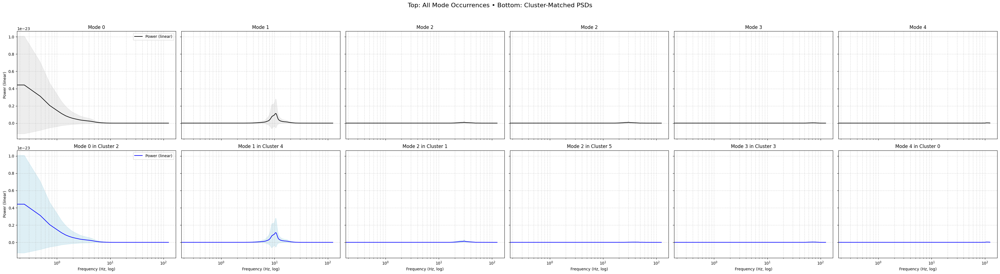

In [82]:
# Plot with default log Y (dB)
plot_cluster_matched_psds(
    features_df,
    output_base,
    method="VMD",
    fs=250,
    custom_order=[
        (2, 0),
        (4, 1),
        (1, 2),
        (5, 2),
        (3, 3),
        (0, 4),
    ],
    log_y=False,
    eps=1e-28
)



In [ ]:
# === 1. Physiological cluster labeling (based on omega or prior info)
cluster_id_to_label = {
    2: "Low-Freq Noise",
    4: "Alpha",
    1: "Beta",
    5: "Low Gamma",
    3: "High Gamma",
    0: "High-Freq Noise"
}

# === 2. Reverse mapping (label → cluster ID)
label_to_cluster_id = {v: k for k, v in cluster_id_to_label.items()}

# === 3. Determine which mode indices are used in each cluster
cluster_mode_map = (
    modes_df.groupby("kmeans_cluster")
    .unique()
    .to_dict()
)

# === 4. Create label → mode mapping
label_to_modes = {
    cluster_id_to_label[cid]: list(sorted(modes))
    for cid, modes in cluster_mode_map.items()
}

# === 5. Manually define the plotting order, splitting mode 2 across clusters
custom_order = [
    ("Low-Freq Noise", 1),        # mode 1 in cluster 2
    ("Alpha", 1),                 # mode 1 in cluster 4
    ("Beta", 2),                  # mode 2 in cluster 1
    ("Low Gamma", 2),            # mode 2 in cluster 5
    ("High Gamma", 4),           # mode 4 in cluster 3
    ("High-Freq Noise", 0)       # mode 0 in cluster 0
]

# === Optional: Print to verify
print("Custom plotting order (label, mode index):")
for label, mode in custom_order:
    cluster_id = label_to_cluster_id[label]
    print(f"→ {label} (Cluster {cluster_id}) contains Mode {mode}")


Custom plotting order (label, mode index):
→ Low-Freq Noise (Cluster 2) contains Mode 1
→ Alpha (Cluster 4) contains Mode 1
→ Beta (Cluster 1) contains Mode 2
→ Low Gamma (Cluster 5) contains Mode 2
→ High Gamma (Cluster 3) contains Mode 4
→ High-Freq Noise (Cluster 0) contains Mode 0


In [ ]:
from scipy.signal import iirnotch, filtfilt, welch

def double_notch(signal, fs, freqs=[50, 100], Q=30):
    """Apply notch filters at specified frequencies."""
    for f in freqs:
        b, a = iirnotch(f, Q, fs)
        signal = filtfilt(b, a, signal)
    return signal

def plot_cluster_psds_only_grid(
    features_df,
    output_base,
    method,
    fs,
    cluster_order,
    cluster_labels,
    nperseg=1024,
    log_y=False,
    eps=1e-30,
    n_cols=2,
    apply_notch=True,
    horizontal=False  # NEW
):
    """
    Plot average PSD per cluster (ignoring mode IDs).
    - Grid layout with optional full horizontal row.
    - Y-axis independent for each cluster.
    - Optional notch filtering and log scaling.
    """
    n_clusters = len(cluster_order)
    if horizontal:
        n_cols = n_clusters
    n_rows = int(np.ceil(n_clusters / n_cols))
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 4 * n_rows), sharex=True)
    axes = np.atleast_1d(axes).flatten()

    for idx, cluster_id in enumerate(cluster_order):
        ax = axes[idx]
        cluster_df = features_df[features_df["kmeans_cluster"] == cluster_id]
        all_psd = []

        for _, row in cluster_df.iterrows():
            ch = row["channel"]
            mode_idx = row["mode"]
            channel_name = f"meg_channel_{ch}"
            mode_path = os.path.join(output_base, channel_name, method, "modes", f"{channel_name}_modes.npy")
            if not os.path.exists(mode_path):
                continue
            modes = np.load(mode_path)
            if mode_idx >= modes.shape[0]:
                continue
            signal = modes[mode_idx]
            if apply_notch:
                signal = double_notch(signal, fs)
            freqs, psd = welch(signal, fs=fs, nperseg=nperseg)
            mask = ~((freqs > 45) & (freqs < 55)) & ~((freqs > 95) & (freqs < 105))
            all_psd.append(psd[mask])

        if all_psd:
            all_psd = np.array(all_psd)
            mean_psd = np.mean(all_psd, axis=0)
            std_psd = np.std(all_psd, axis=0)
            freqs_masked = freqs[mask]

            if log_y:
                mean_plot = 10 * np.log10(mean_psd + eps)
                std_plot = 10 * np.log10(mean_psd + std_psd + eps) - mean_plot
                label = "Power (dB)"
                color = "blue"
                fill_color = "skyblue"
            else:
                mean_plot = mean_psd
                std_plot = std_psd
                label = "Power (linear)"
                color = "blue"
                fill_color = "skyblue"

            ax.plot(freqs_masked, mean_plot, color=color)
            ax.fill_between(freqs_masked, mean_plot - std_plot, mean_plot + std_plot, color=fill_color, alpha=0.4)

        ax.set_title(cluster_labels[cluster_id])
        ax.set_xlabel("Frequency (Hz)")
        if idx % n_cols == 0:
            ax.set_ylabel("Power (dB)" if log_y else "Power (linear)")
        ax.grid(True, which='both', ls='--', alpha=0.5)
        ax.set_xscale("log")

    for ax in axes[n_clusters:]:
        ax.axis("off")

    fig.suptitle("Average PSD per Cluster", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


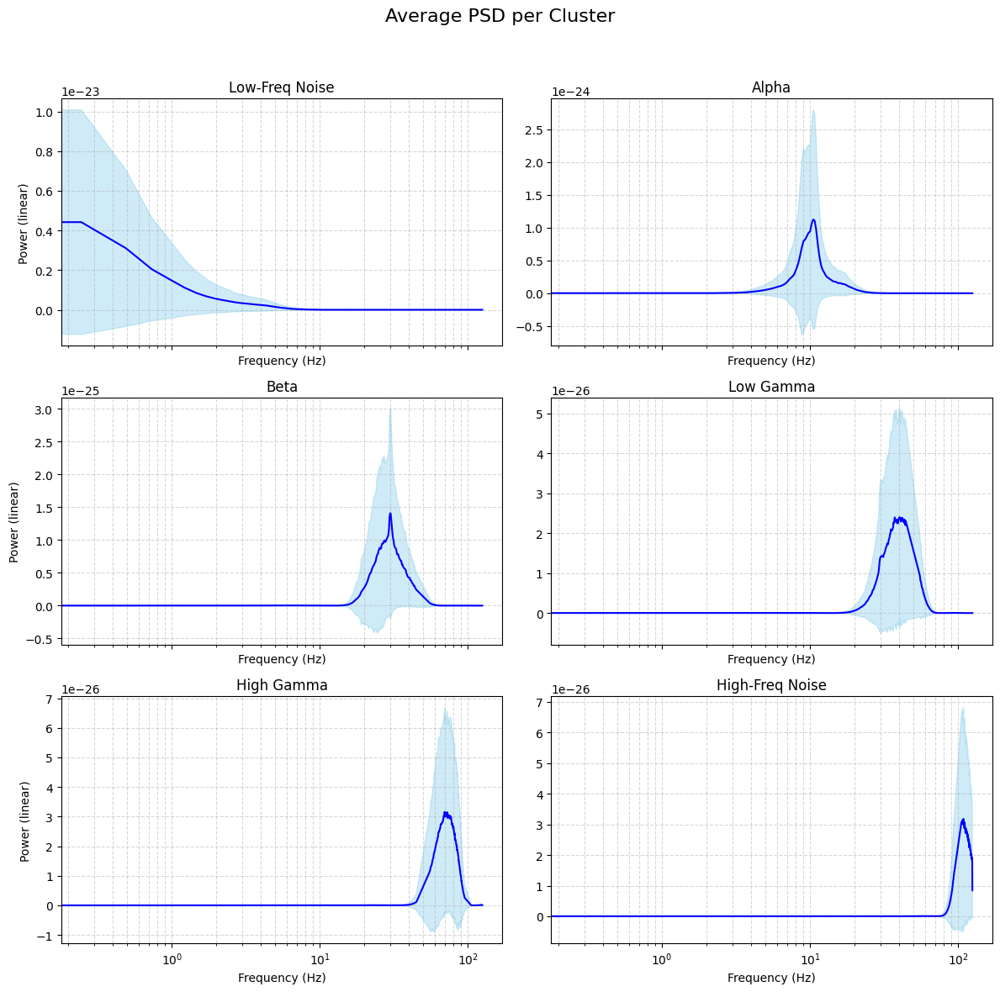

In [186]:
plot_cluster_psds_only_grid(
    features_df=features_df,
    output_base=output_base,
    method="VMD",
    fs=250,
    cluster_order=[2, 4, 1, 5, 3, 0],
    cluster_labels={
        2: "Low-Freq Noise",
        4: "Alpha",
        1: "Beta",
        5: "Low Gamma",
        3: "High Gamma",
        0: "High-Freq Noise"
    },
    log_y=False,
    apply_notch=False,
    horizontal=False 
)


##### STEP 5: Intra-Cluster Signal Correlation Using Hierarchical Clustering

In [ ]:
# Correlation Matrices within Each Cluster
cluster_corrs = {}
cluster_signals = {}

for clust_id in sorted(modes_df["kmeans_cluster"].unique()):
    signals = modes_df[modes_df["kmeans_cluster"] == clust_id]["signal"].tolist()
    n = len(signals)
    corr_mat = np.eye(n)  # Identity matrix (1 on diagonal)

    for i in range(n):
        for j in range(i+1, n):  # upper triangle only
            r, _ = pearsonr(signals[i], signals[j])
            corr_mat[i, j] = r
            corr_mat[j, i] = r

    cluster_corrs[clust_id] = corr_mat
    cluster_signals[clust_id] = signals

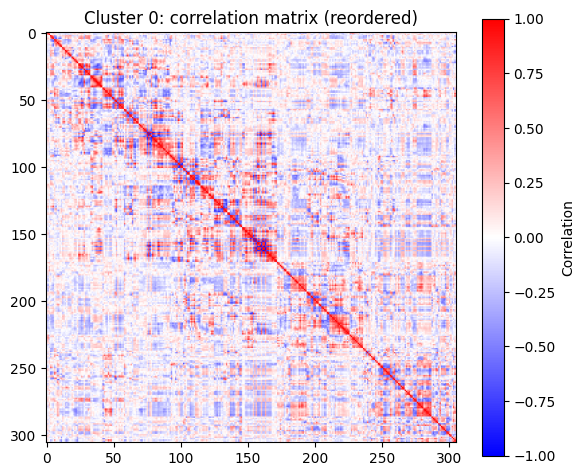

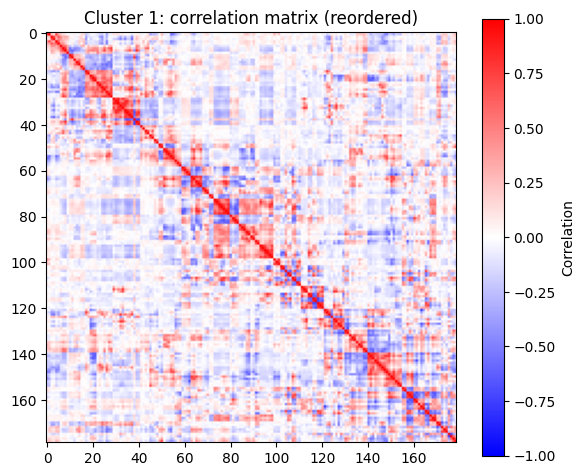

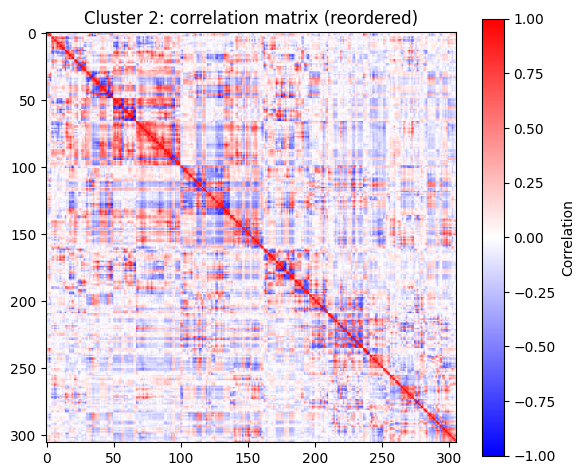

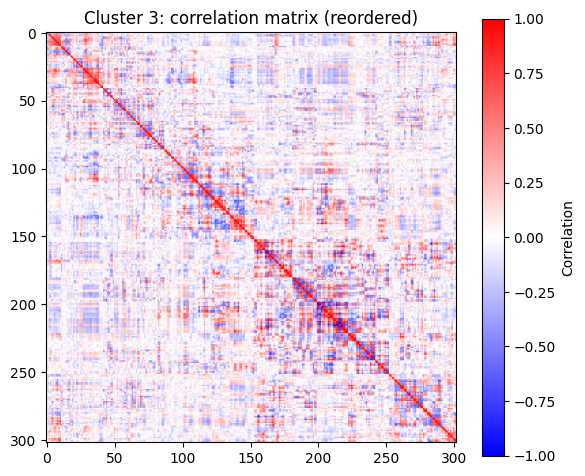

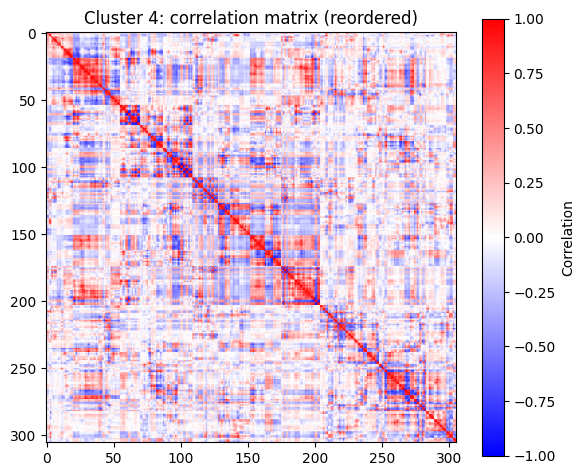

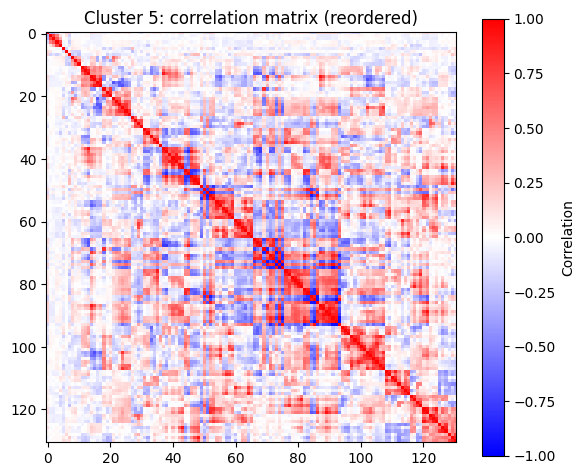

In [214]:
# Reorder Each Matrix Using Hierarchical Clustering
for clust_id, corr_mat in cluster_corrs.items():
    dist = 1 - np.abs(corr_mat)  # convert to distance matrix (range 0–1)
    condensed_dist = squareform(dist)  # convert to condensed format
    Z = linkage(condensed_dist, method='average')
    dendro = dendrogram(Z, no_plot=True)
    order = dendro['leaves']
    reordered_corr = corr_mat[np.ix_(order, order)]

    plt.figure(figsize=(6, 5))
    plt.imshow(reordered_corr, cmap='bwr', vmin=-1, vmax=1)
    plt.colorbar(label='Correlation')
    plt.title(f"Cluster {clust_id}: Correlation Matrix (Reordered)")
    plt.tight_layout()
    plt.show()

## 3. Enveloppes extraction

In [ ]:
extract_envelopes_modes(
    base_dir=output_base,
    method="VMD",
    sfreq=250,
    features_df_path="../results/real/benchmark/features_df.csv",
    overwrite=True  # Change to True to recompute envelopes even if they exist
)

In [290]:
method = "VMD"
envelopes_list = [None] * len(modes_df)  # Pre-allocate list

# Group rows by channel to avoid reloading same file
for ch in tqdm(modes_df["channel"].unique(), desc="Assigning envelopes"):
    envelope_path = os.path.join(
        output_base,
        f"meg_channel_{ch}",
        method,
        "envelopes",
        f"meg_channel_{ch}_envelopes.npy"
    )

    if not os.path.exists(envelope_path):
        print(f"⚠️ Envelope file not found for channel {ch}")
        continue

    try:
        envelopes = np.load(envelope_path)
        # Filter rows for this channel
        rows = modes_df[modes_df["channel"] == ch]
        for idx, row in rows.iterrows():
            m = row["mode"]
            if m < envelopes.shape[0]:
                envelopes_list[idx] = envelopes[m]
            else:
                print(f"⚠️ Mode {m} out of range for channel {ch}")
    except Exception as e:
        print(f"❌ Error reading envelope for ch {ch}: {e}")

# Add the envelope column all at once
modes_df["envelope"] = envelopes_list

# Save the DataFrame
output_path = os.path.join(output_base, "modes_df_with_envelopes.csv")
modes_df.to_pickle("modes_df_with_enveloppes.pkl")
print("✅ Done. Saved 'modes_df_with_envelopesx")


Assigning envelopes: 100%|██████████| 306/306 [00:06<00:00, 50.35it/s]


✅ Done. Saved 'modes_df_with_envelopesx


In [40]:
modes_df

,channel,mode,kmeans_cluster,band,signal,envelope,subgroup,channel_name
0,0,0,2,NotClassified,"[-5.01758334e-14, -5.26101499e-14, -5.03089783...","[2.8177592443329006e-13, 2.8668228597430954e-1...",0,MEG0111
1,0,1,4,Alpha,"[-3.39276335e-14, -3.21253271e-14, -1.89684253...","[2.7250890927819998e-14, 2.785742239335394e-14...",0,MEG0111
2,0,2,5,Low Gamma,"[6.95204261e-14, -1.86157928e-14, -7.94430543e...","[1.455957703064348e-14, 1.4221803056003645e-14...",0,MEG0111
3,0,3,3,Low Gamma,"[9.05414761e-15, -2.01924152e-14, 3.79853736e-15]","[7.575783469990257e-15, 9.673184792539592e-15,...",0,MEG0111
4,0,4,0,High Gamma,"[-6.99557839e-15, 1.55628864e-14, -4.7889929e-14]","[2.1089726569995594e-14, 2.706956615900538e-14...",0,MEG0111
...,...,...,...,...,...,...,...,...
1525,305,0,2,NotClassified,"[-2.10789416e-12, -2.09099555e-12, -1.98695899...","[2.647952165276244e-12, 2.6509521500742433e-12...",0,MEG2643
1526,305,1,4,Alpha,"[1.73103677e-12, 1.68026477e-12, 1.64085297e-12]","[1.1040721620501218e-12, 1.1338227061573817e-1...",0,MEG2643
1527,305,2,5,Low Gamma,"[-1.07745082e-12, -6.958314e-13, 3.22233789e-13]","[5.277677441682242e-13, 5.456402457457698e-13,...",34,MEG2643
1528,305,3,3,Low Gamma,"[1.08403568e-12, -2.33141667e-12, 7.72909003e-13]","[7.68164658969943e-13, 8.532404586736608e-13, ...",119,MEG2643


In [ ]:
cluster_corrs = {}
cluster_envelope = {}

for clust_id in sorted(modes_df["kmeans_cluster"].unique()):
    envelopes = modes_df[modes_df["kmeans_cluster"] == clust_id]["envelope"].tolist()
    n = len(envelopes)
    corr_mat = np.eye(n)  # initialize with 1s on diagonal

    for i in range(n):
        for j in range(i+1, n):  # only upper triangle
            r, _ = pearsonr(envelopes[i], envelopes[j])
            corr_mat[i, j] = r
            corr_mat[j, i] = r  # force symmetry

    cluster_corrs[clust_id] = corr_mat
    cluster_envelope[clust_id] = envelopes

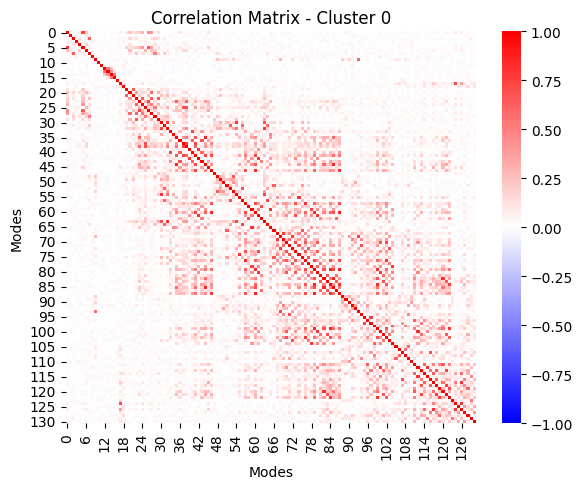

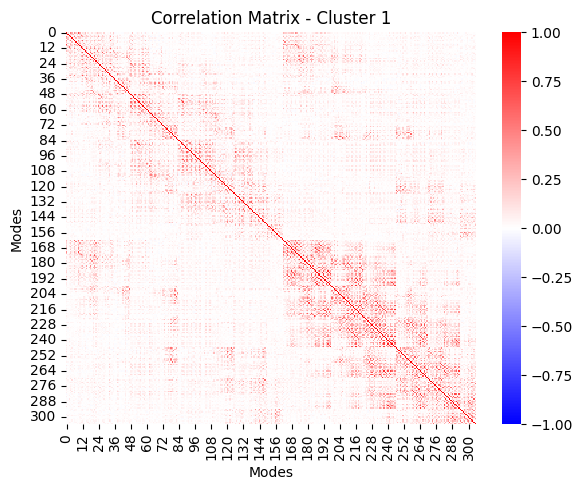

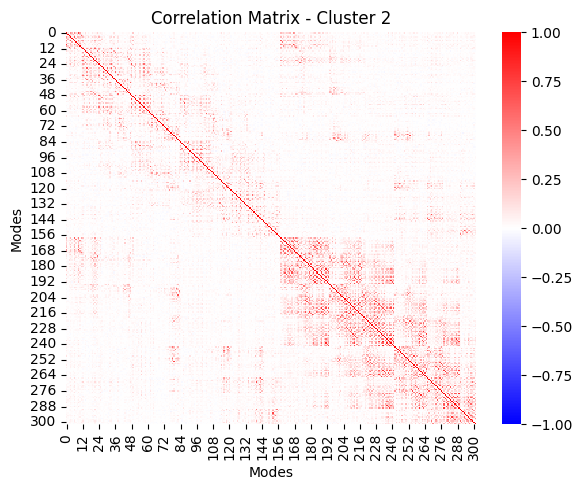

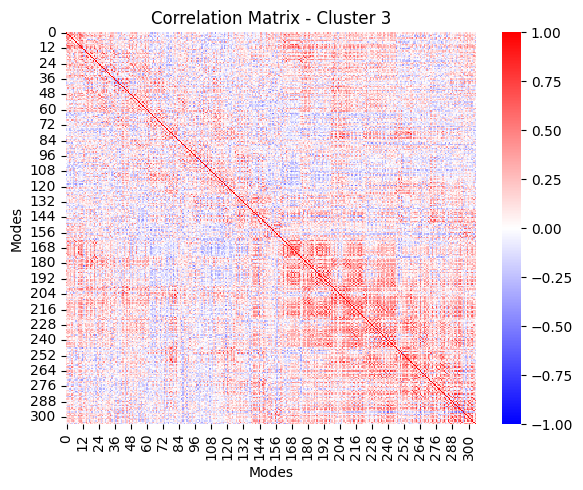

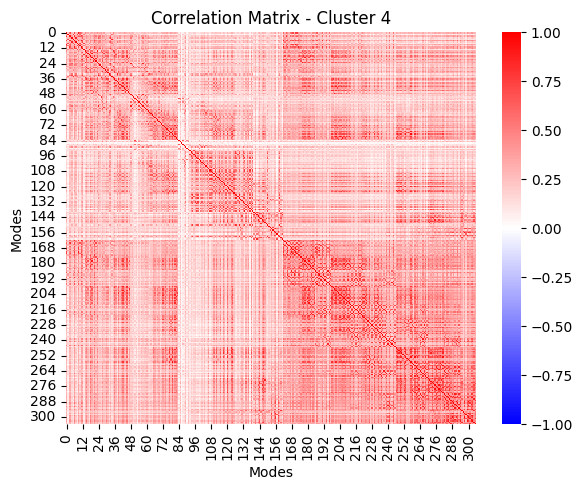

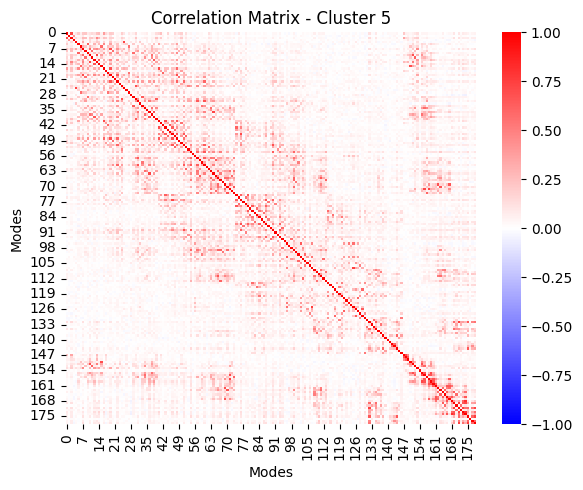

In [189]:
# Sort cluster IDs
cluster_ids = sorted(cluster_corrs.keys())

for clust_id in cluster_ids:
    corr_mat = cluster_corrs[clust_id]

    plt.figure(figsize=(6, 5))
    sns.heatmap(
    corr_mat,
    cmap='bwr',
    center=0,
    cbar=True,
    vmin=-1, 
    vmax=1 )
    plt.title(f"Correlation Matrix - Cluster {clust_id}")
    plt.xlabel("Modes")
    plt.ylabel("Modes")
    plt.tight_layout()
    plt.show()


In [11]:
def compute_envelope_corr(envelopes):
    """Compute correlation matrix from list of 1D envelopes."""
    matrix = np.column_stack(envelopes)  # shape: (T, N)
    corr = np.corrcoef(matrix.T)         # shape: (N, N)
    return corr

def reorder_corr_with_cah(corr, method='average'):
    """Return reordered correlation matrix and order from CAH."""
    dist = 1 - corr
    Z = linkage(squareform(dist, checks=False), method=method)
    order = dendrogram(Z, no_plot=True)["leaves"]
    corr_reordered = corr[np.ix_(order, order)]
    return corr_reordered, order

def assign_subgroups_from_corr(corr, threshold=0.7):
    """
    Use graph clustering to assign subgroups based on correlation threshold.
    Returns a list of subgroup labels (same order as input corr matrix).
    """
    adj = (corr >= threshold).astype(int)
    np.fill_diagonal(adj, 0)
    G = nx.from_numpy_array(adj)
    components = list(nx.connected_components(G))

    labels = np.full(len(corr), -1)
    for group_id, comp in enumerate(components):
        for i in comp:
            labels[i] = group_id
    return labels

def save_cluster_corr_bundle(cluster_id, corr, corr_reordered, indices, reordered_indices, output_dir="corr_matrices"):
    """Save everything in a single .npz file."""
    os.makedirs(output_dir, exist_ok=True)
    out_path = os.path.join(output_dir, f"cluster_{cluster_id}_corr_bundle.npz")
    np.savez(out_path,
             corr=corr,
             corr_reordered=corr_reordered,
             indices=indices,
             indices_reordered=reordered_indices)
    print(f"💾 Saved: {out_path}")

def plot_corr(corr, title):
    """Quick heatmap for visual check."""
    plt.figure(figsize=(5, 4))
    sns.heatmap(corr, vmin=-1, vmax=1, cmap="bwr", square=True,
                xticklabels=False, yticklabels=False)
    plt.title(title)
    plt.tight_layout()
    plt.show()


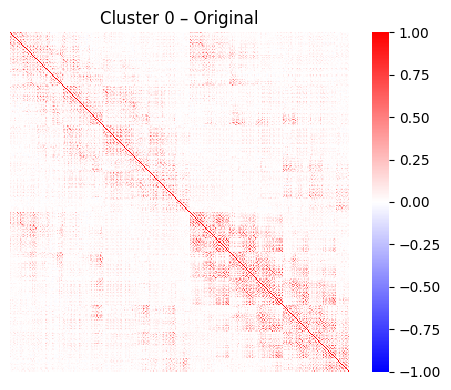

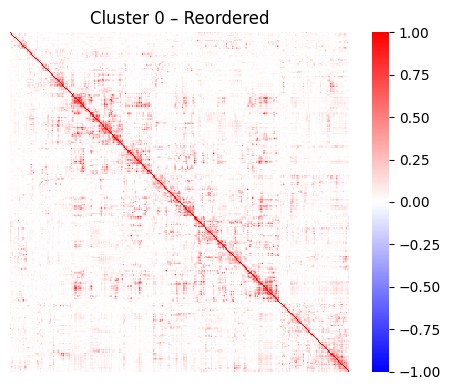

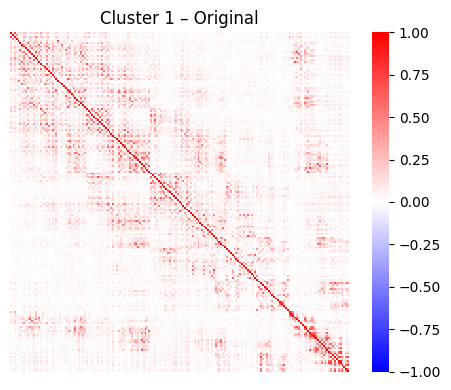

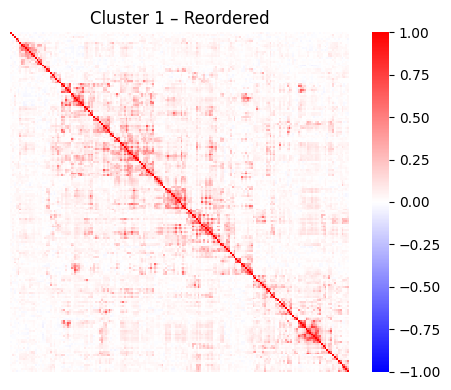

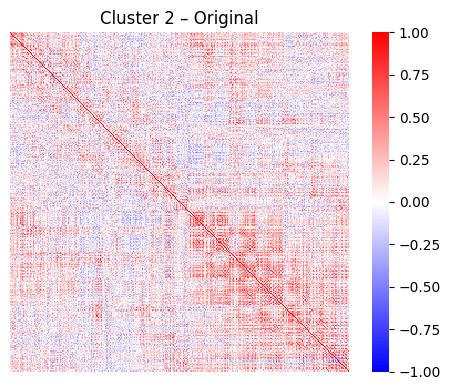

...

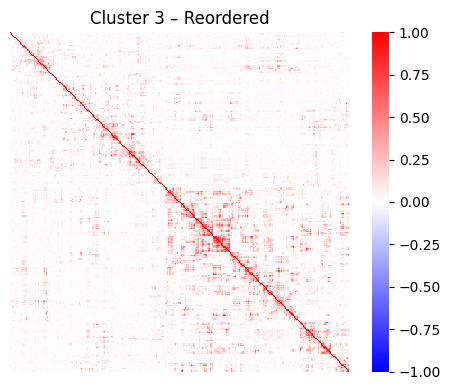

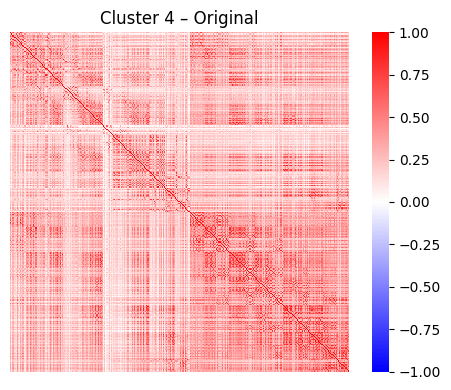

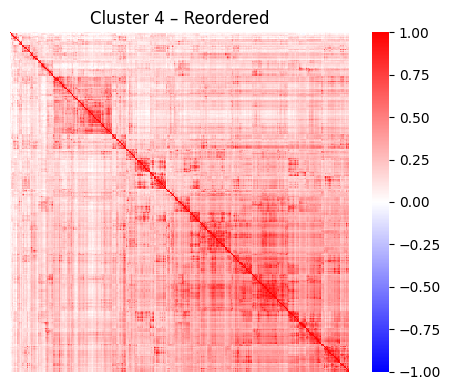

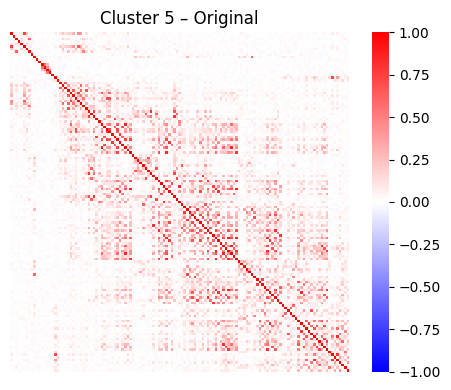

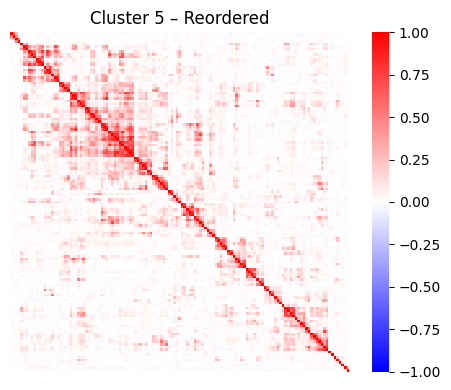

💾 All correlation matrices saved in single files.


In [18]:
corr_dict = {}
reordered_dict = {}
reordered_index_dict = {}

modes_df["subgroup"] = np.nan  # initialize column

for cluster_id in sorted(modes_df["kmeans_cluster"].unique()):
    cluster_df = modes_df[modes_df["kmeans_cluster"] == cluster_id]
    envelopes = cluster_df["envelope"].tolist()
    indices = cluster_df.index.tolist()

    if len(envelopes) < 2:
        print(f"⚠️ Skipping cluster {cluster_id} (only {len(envelopes)} envelope)")
        continue

    # 1. Compute correlation
    corr = compute_envelope_corr(envelopes)

    # 2. Reorder with CAH
    corr_reordered, order = reorder_corr_with_cah(corr)
    reordered_indices = [indices[i] for i in order]

    # 3. Save in dicts
    corr_dict[cluster_id] = corr
    reordered_dict[cluster_id] = corr_reordered
    reordered_index_dict[cluster_id] = reordered_indices

    # 4. Subgroup assignment
    subgroup_labels = assign_subgroups_from_corr(corr)
    for local_i, global_i in enumerate(indices):
        modes_df.loc[global_i, "subgroup"] = subgroup_labels[local_i]

    # 5. Show correlation matrix plots (original and reordered)
    plot_corr(corr, f"Cluster {cluster_id} – Original")
    plot_corr(corr_reordered, f"Cluster {cluster_id} – Reordered")


# Convert keys to strings for saving
corr_dict_str = {str(k): v for k, v in corr_dict.items()}
reordered_dict_str = {str(k): v for k, v in reordered_dict.items()}
reordered_index_dict_str = {str(k): v for k, v in reordered_index_dict.items()}

# Save all in batch
out_dir = "../results/real/benchmark"
os.makedirs(out_dir, exist_ok=True)

np.savez(os.path.join(out_dir, "corr_all_clusters.npz"), **corr_dict_str)
np.savez(os.path.join(out_dir, "corr_reordered_all_clusters.npz"), **reordered_dict_str)
np.savez(os.path.join(out_dir, "corr_reordered_indices.npz"), **reordered_index_dict_str)

print("💾 All correlation matrices saved in single files.")


In [ ]:
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

def plot_reordered_corr_matrices_grid(
    reordered_dict,
    cluster_names=None,
    cluster_order=None,
    add_colorbar=True
):
    """
    Plot a 3x2 grid of reordered envelope correlation matrices for each cluster, with optional colorbar.

    Parameters
    ----------
    reordered_dict : dict
        cluster_id → reordered correlation matrix (numpy array)
    cluster_names : dict
        cluster_id → human-readable name
    cluster_order : list
        Order in which to display clusters
    add_colorbar : bool
        If True, show a global colorbar
    """
    if cluster_names is None:
        cluster_names = {
            0: "High-Freq Noise",
            1: "Beta",
            2: "Low-Freq Noise",
            3: "High Gamma",
            4: "Alpha",
            5: "Low Gamma",
        }

    if cluster_order is None:
        cluster_order = [2, 4, 1, 5, 3, 0]

    n_rows, n_cols = 3, 2
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 14))
    vmin, vmax = -1, 1
    cmap = "coolwarm"

    for idx, cluster_id in enumerate(cluster_order):
        row, col = divmod(idx, n_cols)
        ax = axes[row, col]

        corr_mat = reordered_dict[cluster_id]
        sns.heatmap(
            corr_mat,
            ax=ax,
            cmap=cmap,
            center=0,
            cbar=False,
            vmin=vmin,
            vmax=vmax,
            square=True,
            xticklabels=False,
            yticklabels=False
        )
        ax.set_title(cluster_names[cluster_id], fontsize=12)

    # Remove extra subplot if fewer than 6
    for idx in range(len(cluster_order), n_rows * n_cols):
        row, col = divmod(idx, n_cols)
        axes[row, col].axis("off")

    # === Global colorbar ===
    if add_colorbar:
        norm = Normalize(vmin=vmin, vmax=vmax)
        sm = ScalarMappable(norm=norm, cmap=cmap)
        sm.set_array([])

        cbar_ax = fig.add_axes([0.92, 0.3, 0.02, 0.4])  # [left, bottom, width, height]
        cbar = plt.colorbar(sm, cax=cbar_ax)
        cbar.set_label("Correlation", fontsize=12)

    plt.suptitle("Envelope Correlation Matrices", fontsize=16)
    plt.tight_layout(rect=[0, 0, 0.9, 0.96])  # Leave room for colorbar
    plt.show()


/var/folders/_p/stbgbx154_v2mk71nn05yw5r0000gn/T/ipykernel_81874/2165357617.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.96])  # Leave room for colorbar


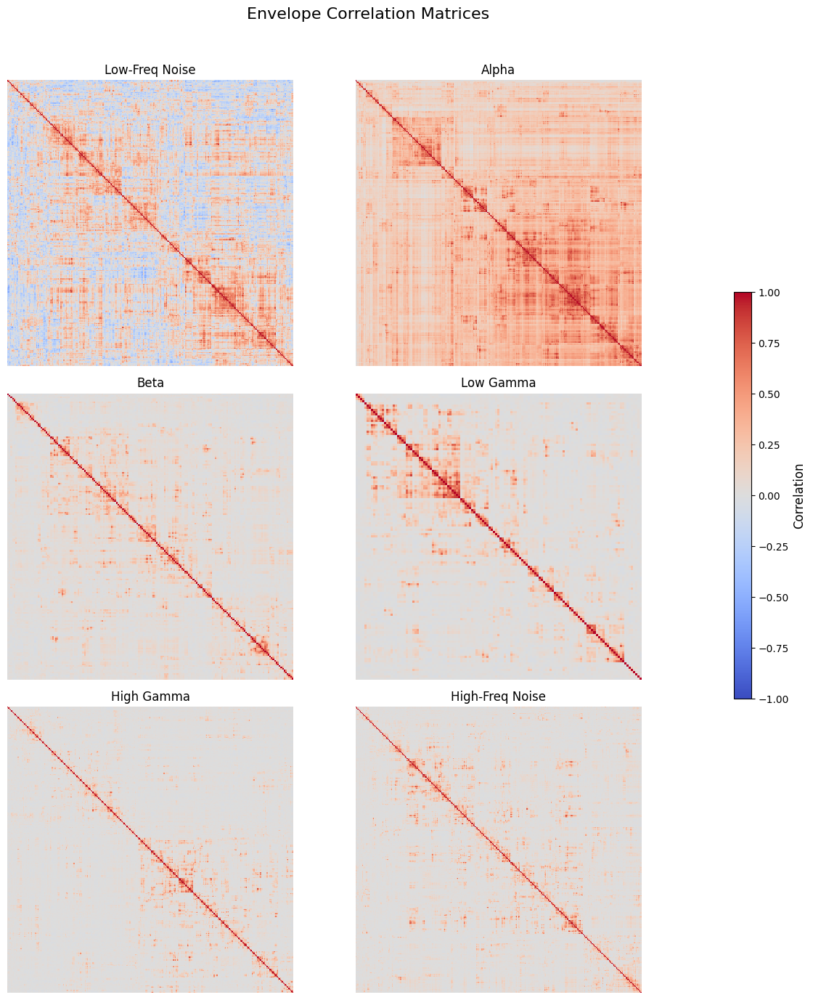

In [46]:
# Load reordered matrices from file
loaded = np.load("../results/real/benchmark/VMD_corr_reordered_all_clusters.npz", allow_pickle=True)
reordered_dict = {int(k): v for k, v in loaded.items()}

# Plot
plot_reordered_corr_matrices_grid(reordered_dict)


In [ ]:

def extract_subgroup_corrs_from_dendrogram(cluster_corrs, n_subgroups=2, method='average'):
    """
    For each cluster correlation matrix, cut the dendrogram into subgroups using hierarchical clustering.
    Return a dict of subgroup correlation matrices per cluster.
    """
    subgroup_corrs = {}

    for cluster_id, corr_mat in cluster_corrs.items():
        print(f"\n📊 Cluster {cluster_id}")

        if corr_mat.shape[0] < 2:
            print("⚠️ Skipping (less than 2 elements)")
            continue

        # Step 1: Distance matrix
        dist_mat = 1 - corr_mat
        dist_condensed = squareform(dist_mat, checks=False)

        # Step 2: Hierarchical clustering
        Z = linkage(dist_condensed, method=method)

        # Step 3: Cut into subgroups
        labels = fcluster(Z, t=n_subgroups, criterion='maxclust')

        # Step 4: Extract sub-correlation matrices
        subgroup_matrices = {}
        for g in range(1, n_subgroups + 1):
            subgroup_indices = np.where(labels == g)[0]
            if len(subgroup_indices) < 2:
                print(f"⚠️ Subgroup {g} has < 2 elements, skipping")
                continue
            sub_corr = corr_mat[np.ix_(subgroup_indices, subgroup_indices)]
            subgroup_matrices[g] = {
                "corr": sub_corr,
                "indices": subgroup_indices
            }

        subgroup_corrs[cluster_id] = subgroup_matrices

    return subgroup_corrs


def plot_subgroup_corr_matrices(subgroup_corrs, cluster_id, figsize=(5, 4)):
    """
    Plot all subgroup correlation matrices for a given cluster.
    """
    if cluster_id not in subgroup_corrs:
        print(f"Cluster {cluster_id} not found.")
        return

    sub_corrs = subgroup_corrs[cluster_id]
    n = len(sub_corrs)
    fig, axes = plt.subplots(1, n, figsize=(figsize[0] * n, figsize[1]))

    if n == 1:
        axes = [axes]

    for i, (g, info) in enumerate(sub_corrs.items()):
        ax = axes[i]
        sns.heatmap(info["corr"], ax=ax, cmap='bwr', vmin=-1, vmax=1,
                    square=True, xticklabels=False, yticklabels=False)
        ax.set_title(f"Subgroup {g}")

    fig.suptitle(f"🔍 Cluster {cluster_id} → {n} Subgroup Correlation Matrices")
    plt.tight_layout()
    plt.show()


📊 Cluster 0

📊 Cluster 1
⚠️ Subgroup 3 has < 2 elements, skipping

📊 Cluster 2

📊 Cluster 3

📊 Cluster 4
⚠️ Subgroup 3 has < 2 elements, skipping

📊 Cluster 5


/var/folders/_p/stbgbx154_v2mk71nn05yw5r0000gn/T/ipykernel_18429/4189296267.py:23: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/opt/homebrew/Caskroom/miniconda/base/envs/mfa-internship/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


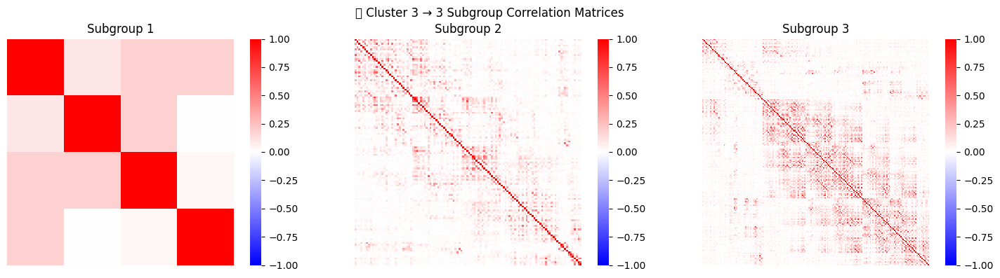

In [ ]:
subgroup_corrs = extract_subgroup_corrs_from_dendrogram(cluster_corrs, n_subgroups=3)

# Plot one cluster's subgroups
plot_subgroup_corr_matrices(subgroup_corrs, cluster_id=3)


In [ ]:
# Save the DataFrame
modes_df.to_pickle("modes_df_with_enveloppes_channels.pkl")
print("✅ Done. Saved 'modes_df_with_enveloppes_channels")

## 4. PCA ON ENVELOPPES BY CLUSTER


🔍 Processing cluster 0
  ➤ Matrix shape for PCA: (82500, 306)
  ➤ Components to explain ≥70% variance: 56


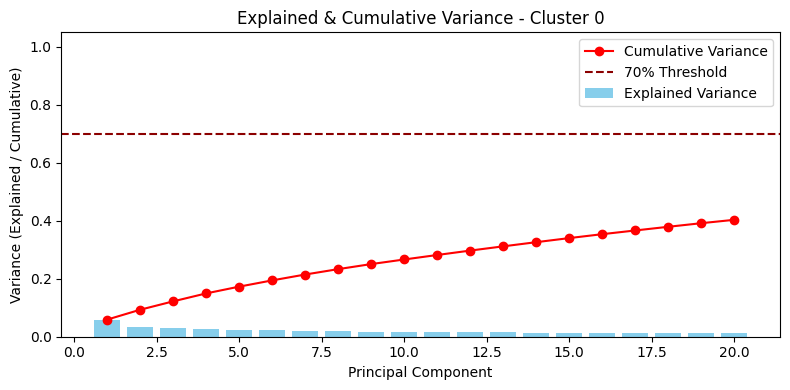

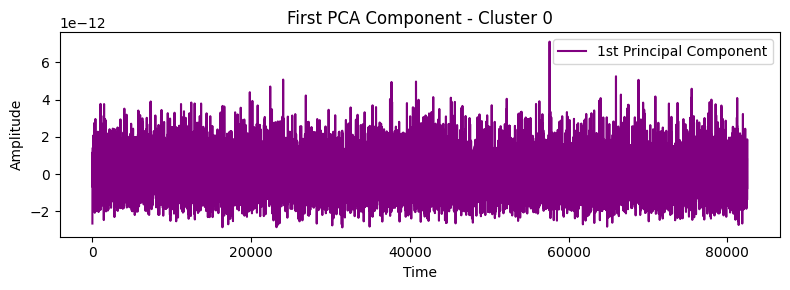


🔍 Processing cluster 1
  ➤ Matrix shape for PCA: (82500, 179)
  ➤ Components to explain ≥70% variance: 31


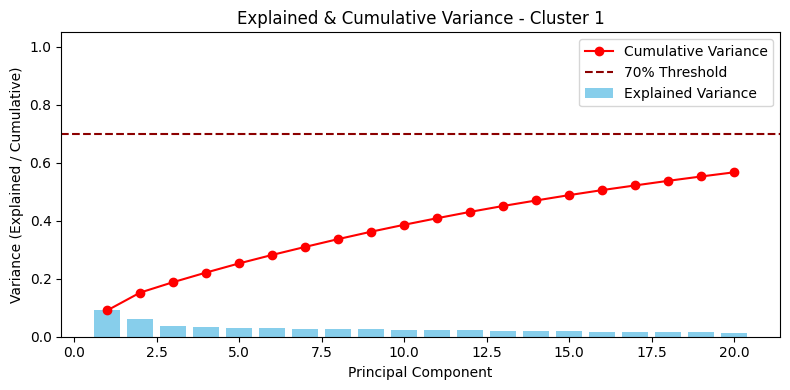

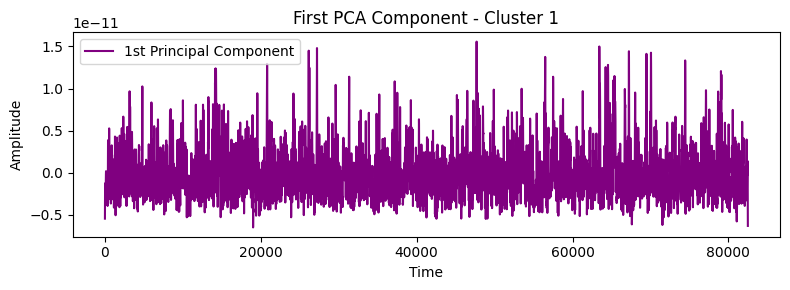


🔍 Processing cluster 2
  ➤ Matrix shape for PCA: (82500, 306)
  ➤ Components to explain ≥70% variance: 12


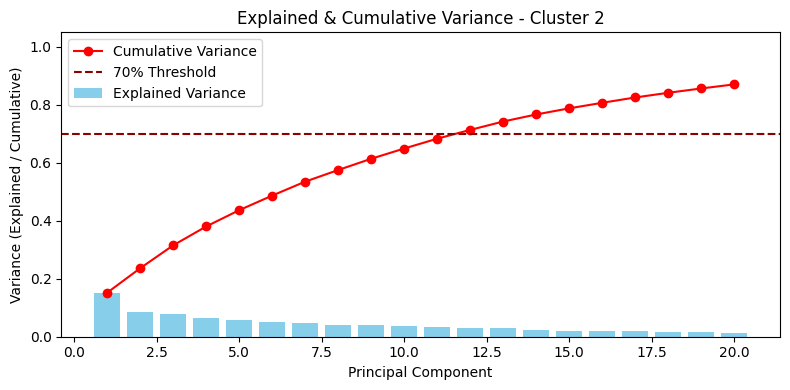

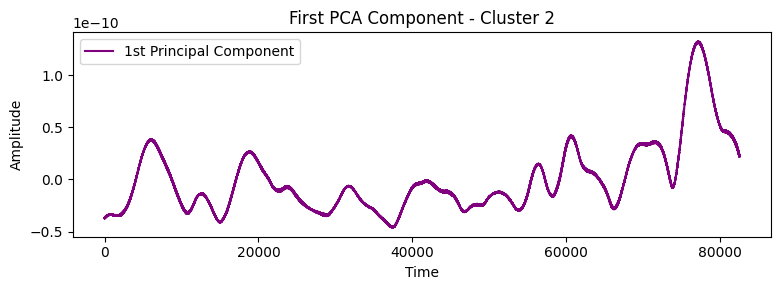


🔍 Processing cluster 3
  ➤ Matrix shape for PCA: (82500, 302)
  ➤ Components to explain ≥70% variance: 62


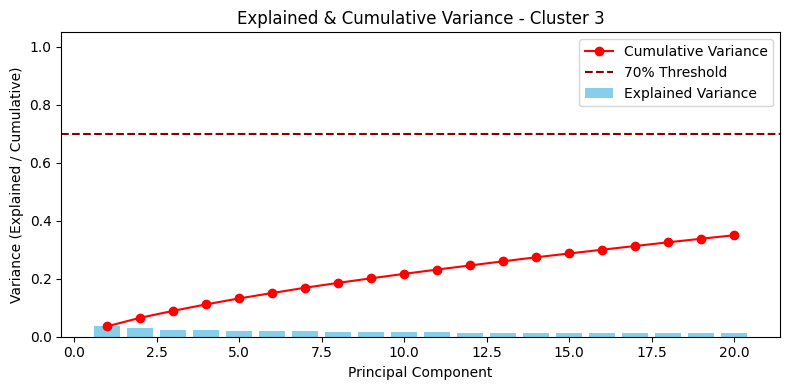

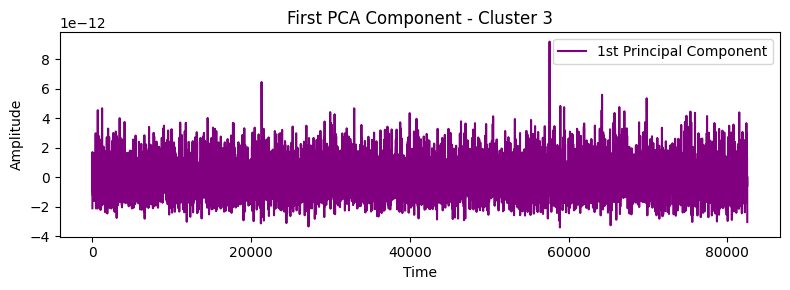


🔍 Processing cluster 4
  ➤ Matrix shape for PCA: (82500, 306)
  ➤ Components to explain ≥70% variance: 12


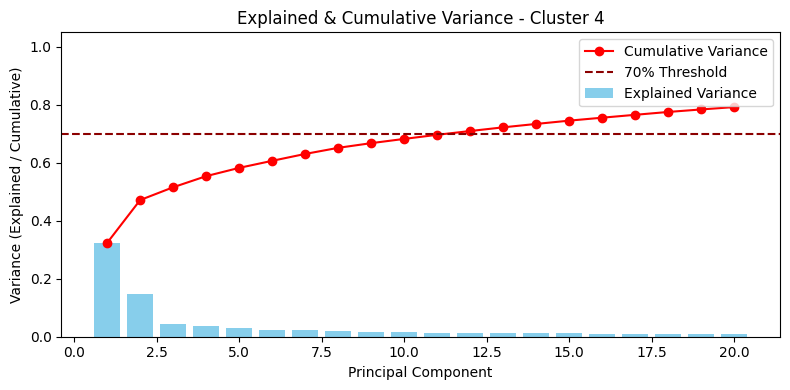

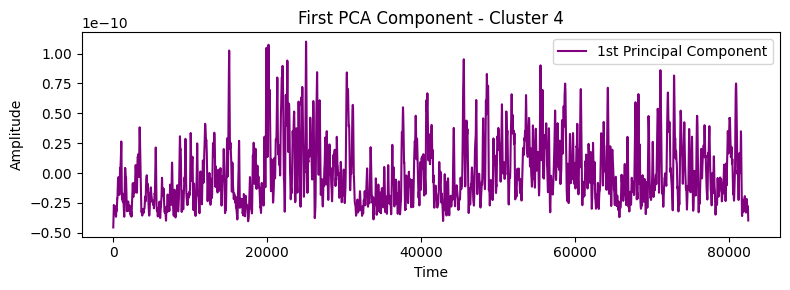


🔍 Processing cluster 5
  ➤ Matrix shape for PCA: (82500, 131)
  ➤ Components to explain ≥70% variance: 25


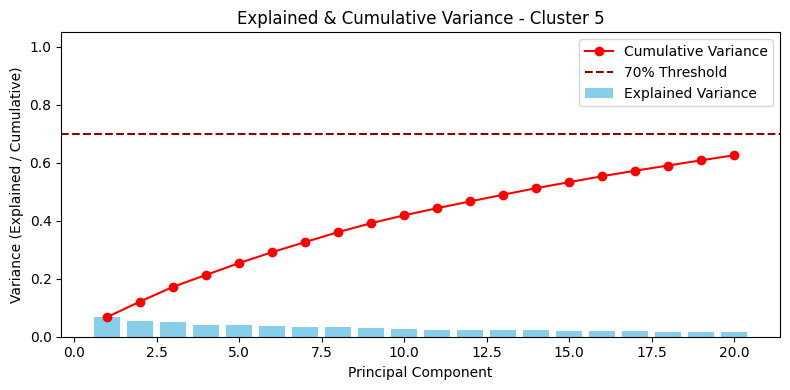

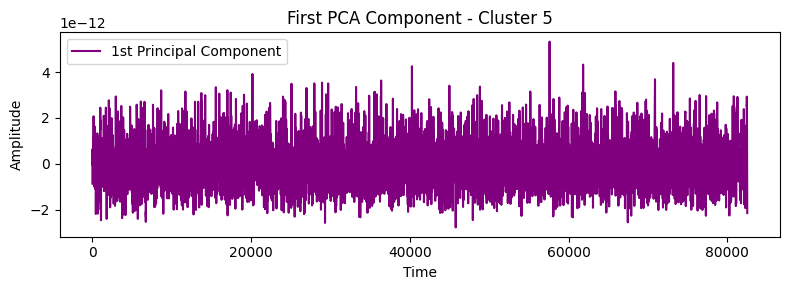

,Cluster,Num Modes,PCs for ≥70% Var
0,0,306,56
1,1,179,31
2,2,306,12
3,3,302,62
4,4,306,12
5,5,131,25


In [318]:
# Initialize result containers
cluster_pca_results = {}
pca_mfa_inputs = {}
summary_table = []

# Loop over unique clusters
for clust_id in sorted(modes_df["kmeans_cluster"].unique()):
    print(f"\n🔍 Processing cluster {clust_id}")
    
    # Get list of envelopes for current cluster
    cluster_envelopes = modes_df[modes_df["kmeans_cluster"] == clust_id]["envelope"].tolist()
    
    try:
        # ➤ 1. Stack the envelopes: shape (n_timepoints, n_modes)
        X = np.column_stack(cluster_envelopes)
        print(f"  ➤ Matrix shape for PCA: {X.shape}")
    except Exception as e:
        print(f"❌ Error stacking envelopes for cluster {clust_id}: {e}")
        continue

    # ➤ 2. Apply PCA
    pca = PCA()
    X_pca = pca.fit_transform(X)

    # ➤ 3. Variance info
    explained_variance = pca.explained_variance_ratio_
    cumulative_variance = np.cumsum(explained_variance)
    n_components_70 = np.argmax(cumulative_variance >= 0.7) + 1

    print(f"  ➤ Components to explain ≥70% variance: {n_components_70}")

    # ➤ 4. Store results
    cluster_pca_results[clust_id] = {
        "pca": pca,
        "X_pca": X_pca,
        "explained_variance": explained_variance,
        "n_components_70": n_components_70
    }
    pca_mfa_inputs[clust_id] = X_pca[:, :n_components_70].T  # Shape: (n_components, time)

    # ➤ 5. Add to summary table
    summary_table.append({
        "Cluster": clust_id,
        "Num Modes": len(cluster_envelopes),
        "PCs for ≥70% Var": n_components_70
    })

    # ➤ 6. Plot: explained variance and cumulative (on same Y axis)
    n_plot = min(20, len(explained_variance))
    fig, ax = plt.subplots(figsize=(8, 4))

    # Barplot for explained variance
    ax.bar(np.arange(1, n_plot + 1), explained_variance[:n_plot], color="skyblue", label="Explained Variance")

    # Line plot for cumulative variance (same Y axis)
    ax.plot(np.arange(1, n_plot + 1), cumulative_variance[:n_plot], color="red", marker="o", label="Cumulative Variance")

    # Threshold line at 70%
    ax.axhline(0.7, color="darkred", linestyle="--", label="70% Threshold")

    # Formatting
    ax.set_ylim(0, 1.05)
    ax.set_xlabel("Principal Component")
    ax.set_ylabel("Variance (Explained / Cumulative)")
    ax.set_title(f"Explained & Cumulative Variance - Cluster {clust_id}")
    ax.legend()
    plt.tight_layout()
    plt.show()


    # ➤ 7. Plot first PC timecourse
    plt.figure(figsize=(8, 3))
    plt.plot(X_pca[:, 0], label="1st Principal Component", color="purple")
    plt.title(f"First PCA Component - Cluster {clust_id}")
    plt.xlabel("Time")
    plt.ylabel("Amplitude")
    plt.legend()
    plt.tight_layout()
    plt.show()

# ➤ 8. Final summary
summary_df = pd.DataFrame(summary_table)
summary_df


In [296]:
summary_table

[{'Cluster': np.int64(0), 'Num Modes': 306, 'PCs for ≥70% Var': np.int64(56)},
 {'Cluster': np.int64(1), 'Num Modes': 179, 'PCs for ≥70% Var': np.int64(31)},
 {'Cluster': np.int64(2), 'Num Modes': 306, 'PCs for ≥70% Var': np.int64(12)},
 {'Cluster': np.int64(3), 'Num Modes': 302, 'PCs for ≥70% Var': np.int64(62)},
 {'Cluster': np.int64(4), 'Num Modes': 306, 'PCs for ≥70% Var': np.int64(12)},
 {'Cluster': np.int64(5), 'Num Modes': 131, 'PCs for ≥70% Var': np.int64(25)}]

| Cluster | Peak?               | Envelope Correlation    | Physiological Confidence | Comment                             |
|---------|---------------------|--------------------------|---------------------------|--------------------------------------|
| **4**   | ✅ Very clear alpha  | ✅ Strong and structured | ✅✅✅ ✅ High              | This is a validated alpha rhythm     |
| **2**   | ❓ Broad bump        | ❓ Medium                | ❓ Possible low-freq rhythm | Needs more validation               |
| **1**   | ❓ Broad beta        | ❓ Weak                  | ❓ May be motor-related    | Possibly task-related                |
| **5**   | ❓ Flat/high beta    | ❌ Weak                  | ❌ Low                    | Not clearly physiological            |
| **3**   | ❓ Gamma-ish         | ❌ Sparse                | ❌ Low                    | Possibly artifact                    |
| **0**   | ❌ None              | ❌ None                  | ❌ Very low               | Likely noise or unstructured         |



🔍 Processing cluster 0
  ➤ Matrix shape for PCA: (3, 306)
  ➤ Components to explain ≥70% variance: 1


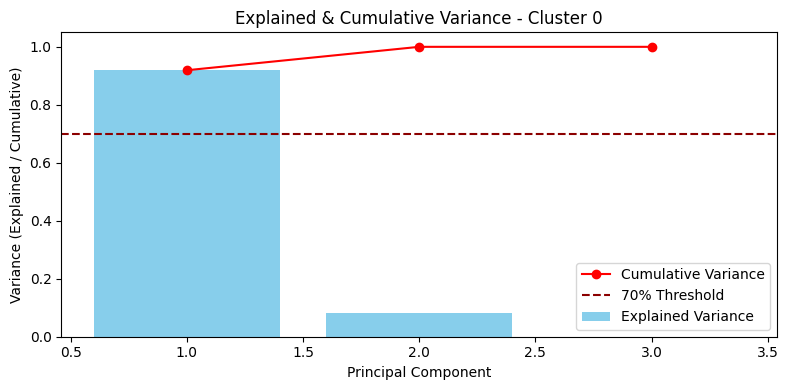

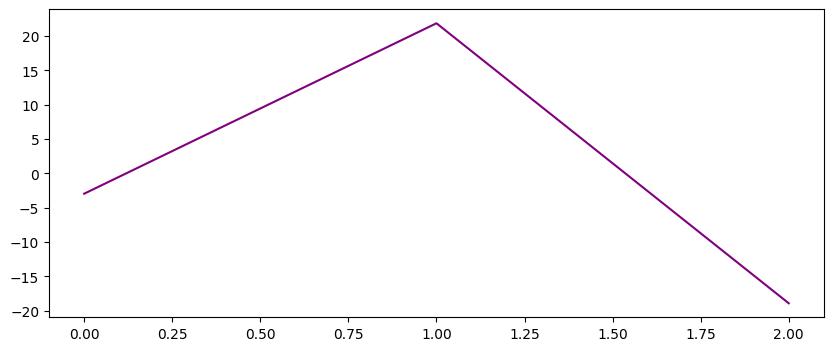

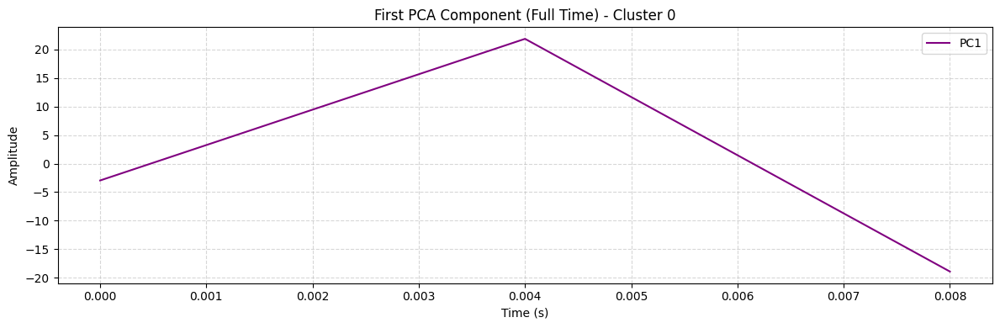


🔍 Processing cluster 1
  ➤ Matrix shape for PCA: (3, 179)
  ➤ Components to explain ≥70% variance: 1


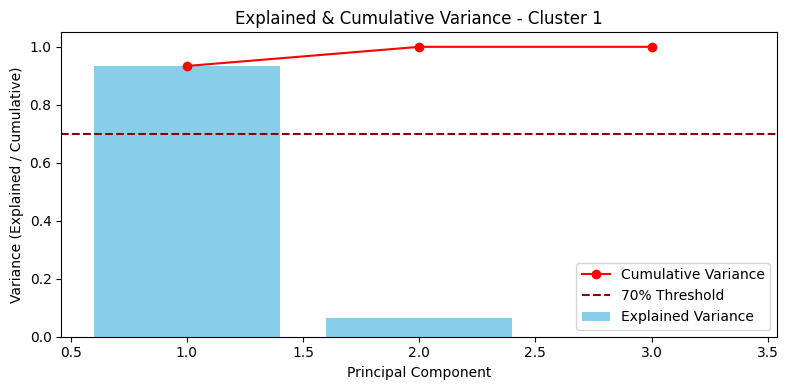

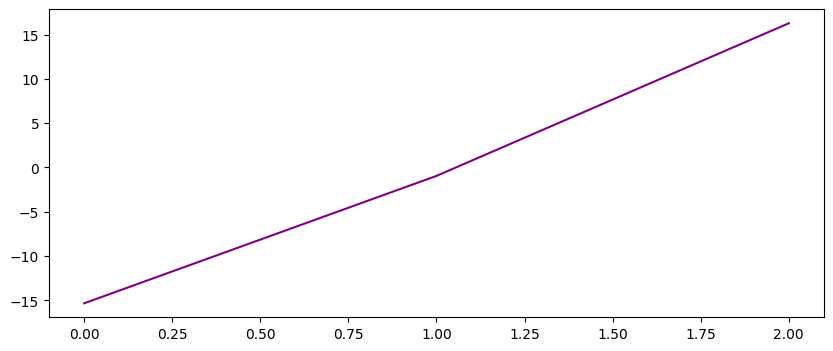

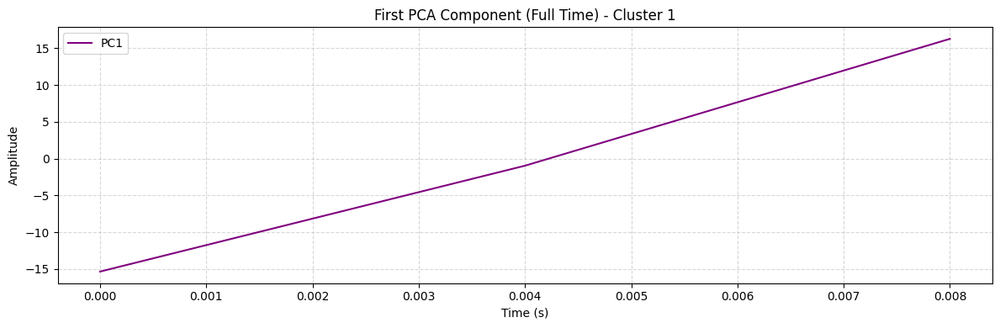


🔍 Processing cluster 2
  ➤ Matrix shape for PCA: (3, 306)
  ➤ Components to explain ≥70% variance: 1


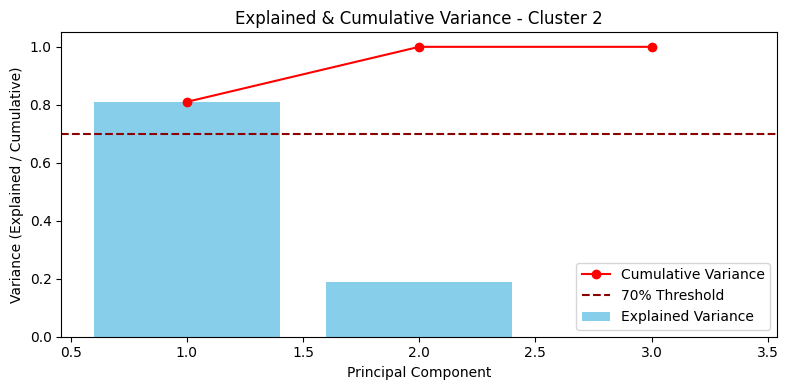

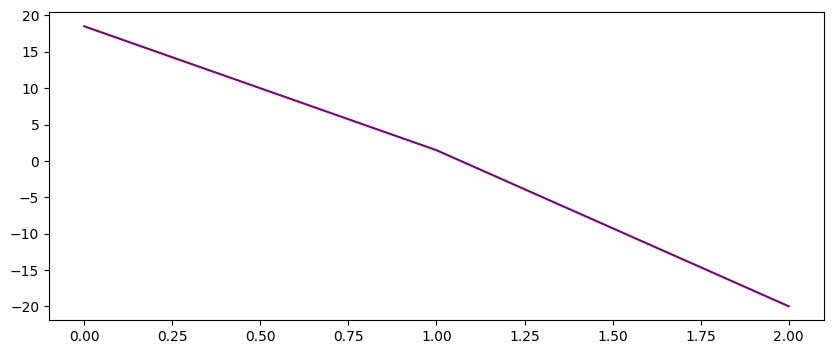

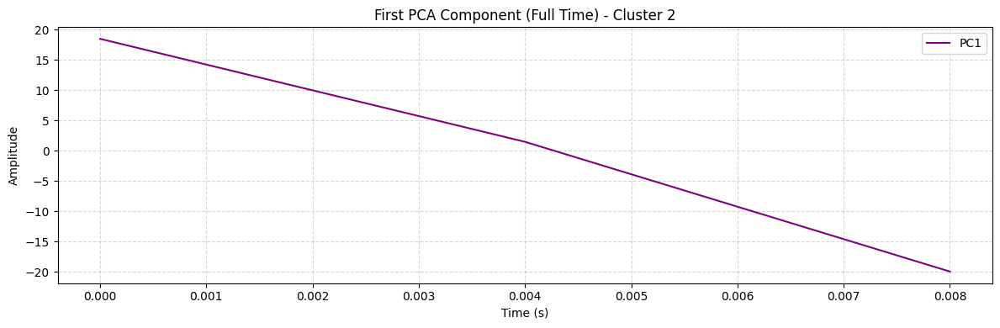


🔍 Processing cluster 3
  ➤ Matrix shape for PCA: (3, 302)
  ➤ Components to explain ≥70% variance: 2


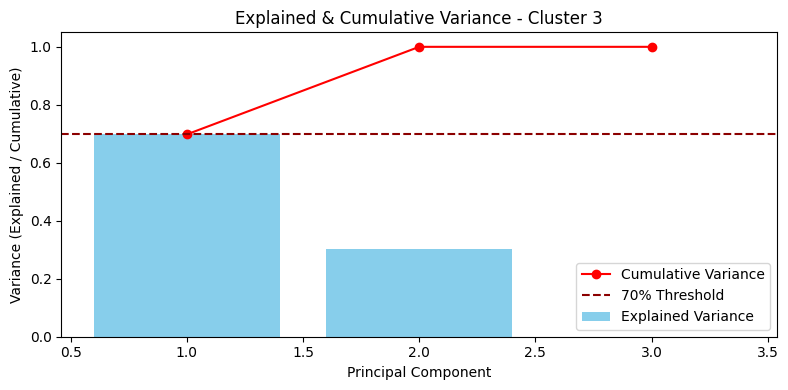

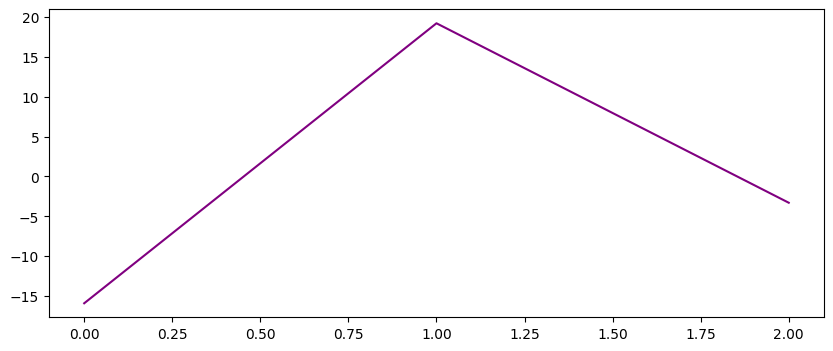

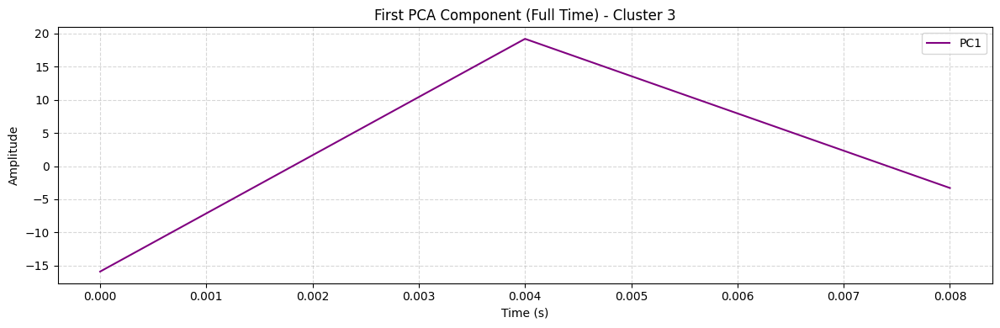


🔍 Processing cluster 4
  ➤ Matrix shape for PCA: (3, 306)
  ➤ Components to explain ≥70% variance: 1


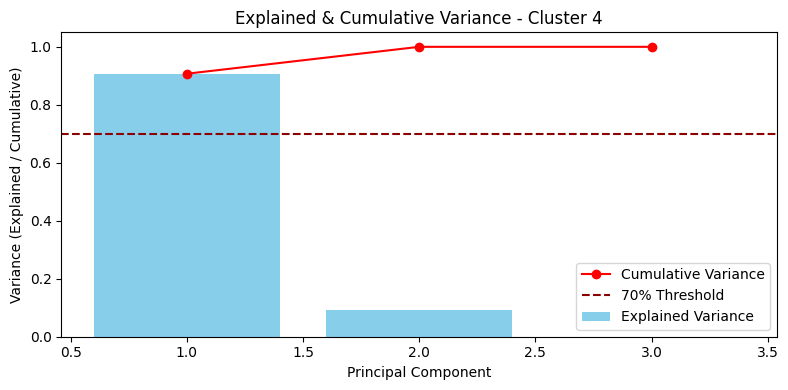

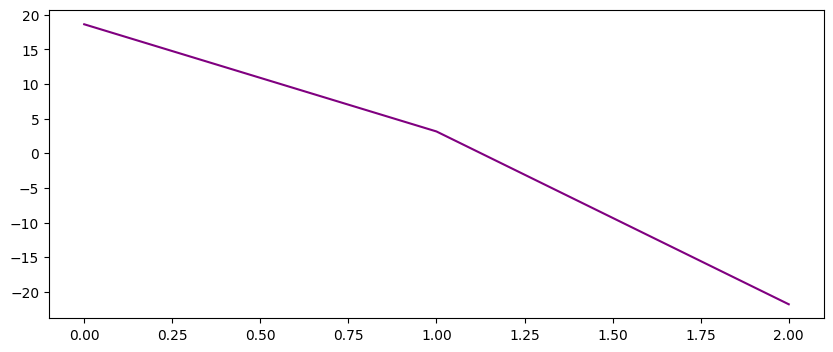

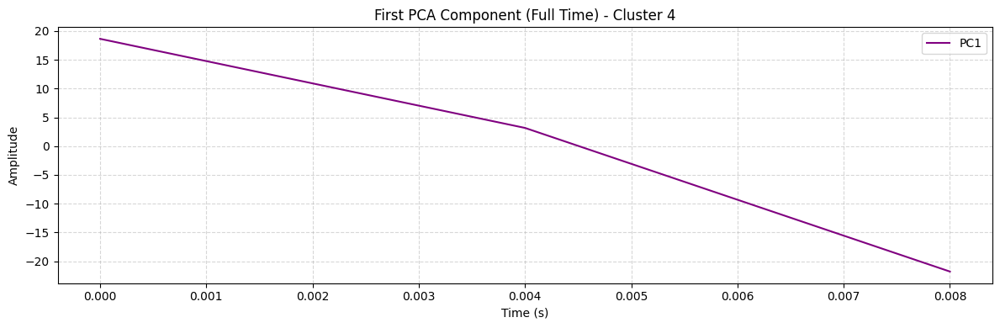


🔍 Processing cluster 5
  ➤ Matrix shape for PCA: (3, 131)
  ➤ Components to explain ≥70% variance: 1


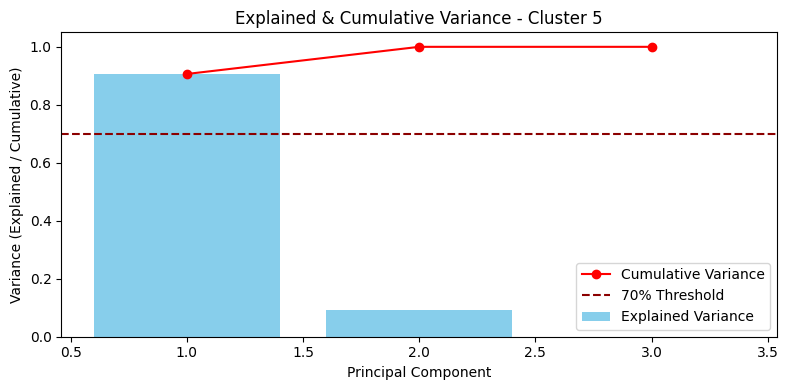

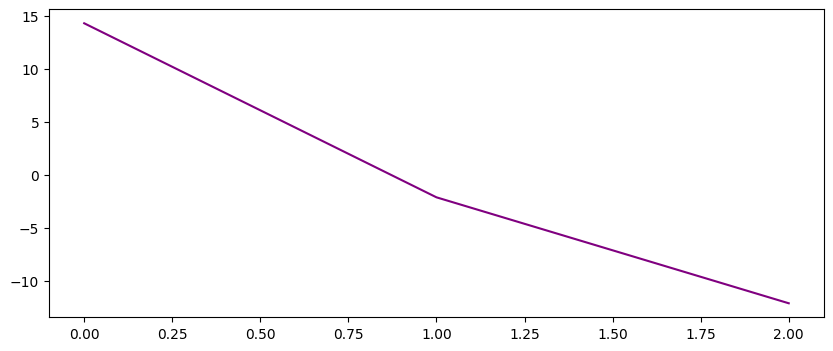

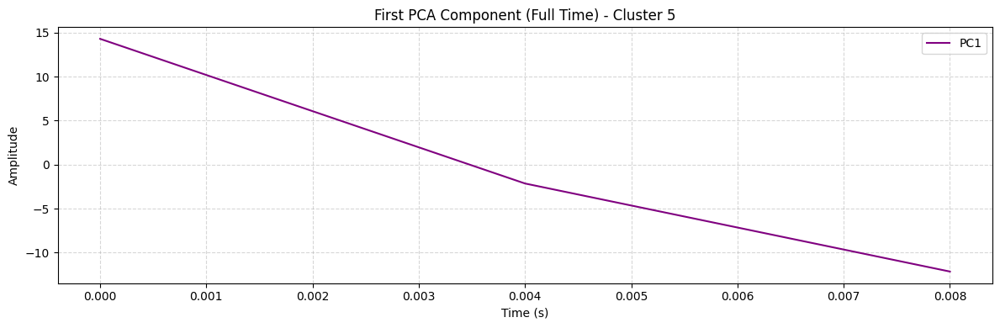

,Cluster,Num Modes,PCs for ≥70% Var
0,0,306,1
1,1,179,1
2,2,306,1
3,3,302,2
4,4,306,1
5,5,131,1


In [718]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# === Initialize containers
cluster_pca_results = {}
pca_mfa_inputs = {}
summary_table = []

# Loop over clusters
for clust_id in sorted(modes_df["kmeans_cluster"].unique()):
    print(f"\n🔍 Processing cluster {clust_id}")
    
    # ➤ 1. Get list of signals for the cluster
    cluster_signals = modes_df[modes_df["kmeans_cluster"] == clust_id]["signal"].tolist()

    # Safety check
    if len(cluster_signals) == 0:
        print(f"⚠️ No signals found for cluster {clust_id}")
        continue

    try:
        # ➤ 2. Standardize each signal (along time axis)
        standardized_signals = []
        for sig in cluster_signals:
            sig_std = (sig - np.mean(sig)) / np.std(sig)
            standardized_signals.append(sig_std)

        # ➤ 3. Stack signals → shape: (n_timepoints, n_modes)
        X = np.column_stack(standardized_signals)
        print(f"  ➤ Matrix shape for PCA: {X.shape}")
    except Exception as e:
        print(f"❌ Error stacking signals for cluster {clust_id}: {e}")
        continue

    # ➤ 4. PCA
    pca = PCA()
    X_pca = pca.fit_transform(X)

    explained_variance = pca.explained_variance_ratio_
    cumulative_variance = np.cumsum(explained_variance)
    n_components_70 = np.argmax(cumulative_variance >= 0.7) + 1

    print(f"  ➤ Components to explain ≥70% variance: {n_components_70}")

    # ➤ 5. Store results
    cluster_pca_results[clust_id] = {
        "pca": pca,
        "X_pca": X_pca,
        "explained_variance": explained_variance,
        "n_components_70": n_components_70
    }
    pca_mfa_inputs[clust_id] = X_pca[:, :n_components_70].T  # Shape: (n_components, time)

    summary_table.append({
        "Cluster": clust_id,
        "Num Modes": len(cluster_signals),
        "PCs for ≥70% Var": n_components_70
    })

    # ➤ 6. Plot explained/cumulative variance
    n_plot = min(20, len(explained_variance))
    fig, ax = plt.subplots(figsize=(8, 4))
    ax.bar(np.arange(1, n_plot + 1), explained_variance[:n_plot], color="skyblue", label="Explained Variance")
    ax.plot(np.arange(1, n_plot + 1), cumulative_variance[:n_plot], color="red", marker="o", label="Cumulative Variance")
    ax.axhline(0.7, color="darkred", linestyle="--", label="70% Threshold")
    ax.set_ylim(0, 1.05)
    ax.set_xlabel("Principal Component")
    ax.set_ylabel("Variance (Explained / Cumulative)")
    ax.set_title(f"Explained & Cumulative Variance - Cluster {clust_id}")
    ax.legend()
    plt.tight_layout()
    plt.show()

    # ➤ 7. Plot first PC timecourse over full time
    plt.figure(figsize=(10, 4))
    plt.plot(X_pca[:, 0], label="1st Principal Component", color="purple")

    # Optional: set time in seconds on x-axis
    fs = 250  # or whatever sampling frequency your signals used
    time = np.arange(X_pca.shape[0]) / fs
    plt.figure(figsize=(12, 4))
    plt.plot(time, X_pca[:, 0], color='purple', label='PC1')
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.title(f"First PCA Component (Full Time) - Cluster {clust_id}")
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.legend()
    plt.tight_layout()
    plt.show()


# ➤ 8. Summary
summary_df = pd.DataFrame(summary_table)
summary_df


## 5. MFA

In [48]:
scaling_ranges = [(6, 12)]
q_vals = np.arange(-3, 6)
summary_records = []
methods = ["VMD"]

In [49]:
modes_df

,channel,mode,kmeans_cluster,band,signal,envelope,subgroup,channel_name
0,0,0,2,NotClassified,"[-5.01758334e-14, -5.26101499e-14, -5.03089783...","[2.8177592443329006e-13, 2.8668228597430954e-1...",0,MEG0111
1,0,1,4,Alpha,"[-3.39276335e-14, -3.21253271e-14, -1.89684253...","[2.7250890927819998e-14, 2.785742239335394e-14...",0,MEG0111
2,0,2,5,Low Gamma,"[6.95204261e-14, -1.86157928e-14, -7.94430543e...","[1.455957703064348e-14, 1.4221803056003645e-14...",0,MEG0111
3,0,3,3,Low Gamma,"[9.05414761e-15, -2.01924152e-14, 3.79853736e-15]","[7.575783469990257e-15, 9.673184792539592e-15,...",0,MEG0111
4,0,4,0,High Gamma,"[-6.99557839e-15, 1.55628864e-14, -4.7889929e-14]","[2.1089726569995594e-14, 2.706956615900538e-14...",0,MEG0111
...,...,...,...,...,...,...,...,...
1525,305,0,2,NotClassified,"[-2.10789416e-12, -2.09099555e-12, -1.98695899...","[2.647952165276244e-12, 2.6509521500742433e-12...",0,MEG2643
1526,305,1,4,Alpha,"[1.73103677e-12, 1.68026477e-12, 1.64085297e-12]","[1.1040721620501218e-12, 1.1338227061573817e-1...",0,MEG2643
1527,305,2,5,Low Gamma,"[-1.07745082e-12, -6.958314e-13, 3.22233789e-13]","[5.277677441682242e-13, 5.456402457457698e-13,...",34,MEG2643
1528,305,3,3,Low Gamma,"[1.08403568e-12, -2.33141667e-12, 7.72909003e-13]","[7.68164658969943e-13, 8.532404586736608e-13, ...",119,MEG2643



📊 Processing kmeans_cluster = 0


<Figure size 800x400 with 0 Axes>

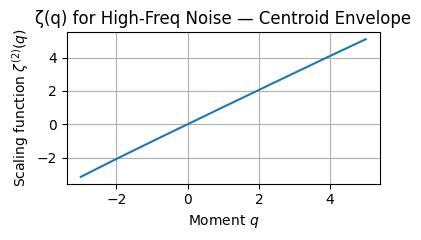

<Figure size 800x400 with 0 Axes>

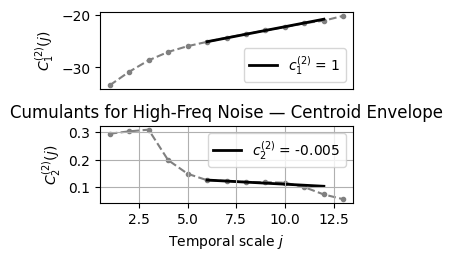

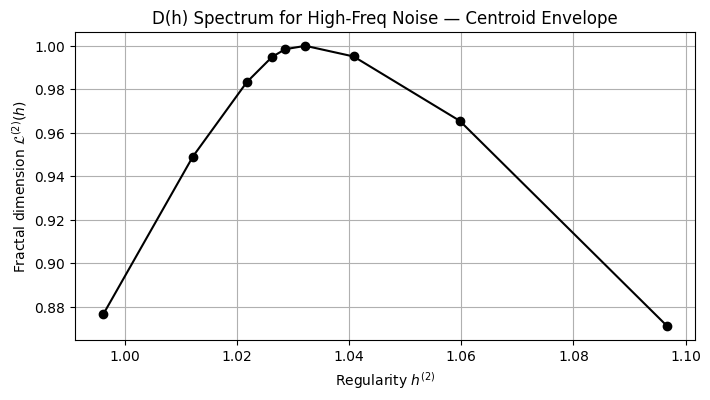


📊 Processing kmeans_cluster = 1


<Figure size 800x400 with 0 Axes>

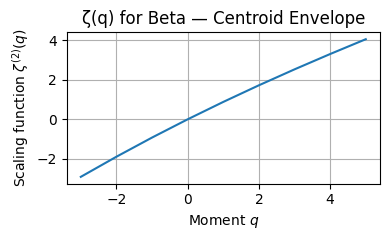

<Figure size 800x400 with 0 Axes>

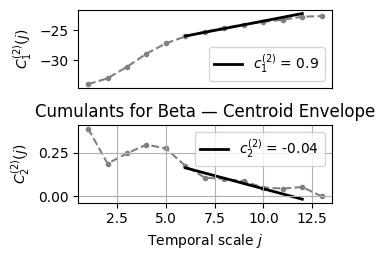

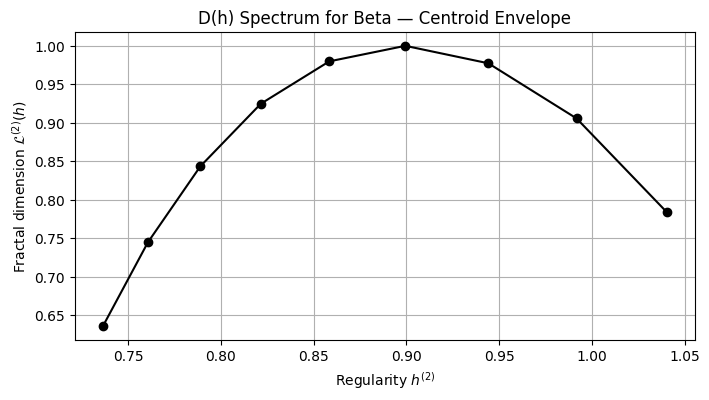


📊 Processing kmeans_cluster = 2


<Figure size 800x400 with 0 Axes>

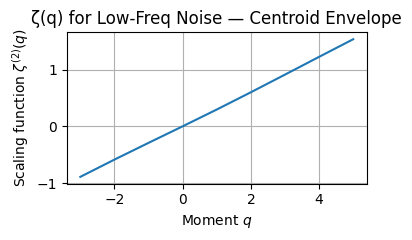

<Figure size 800x400 with 0 Axes>

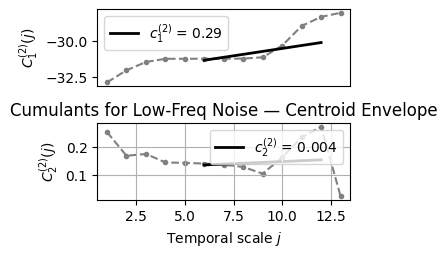

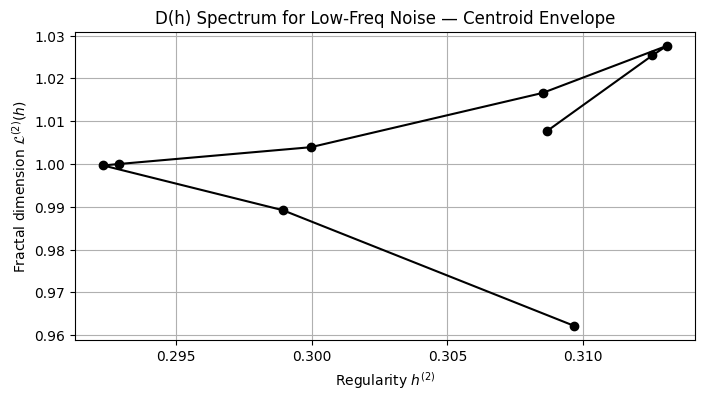


📊 Processing kmeans_cluster = 3


<Figure size 800x400 with 0 Axes>

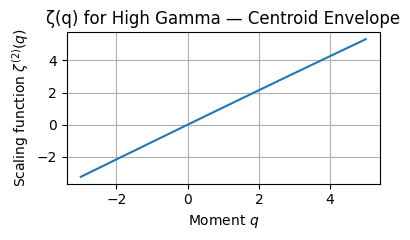

<Figure size 800x400 with 0 Axes>

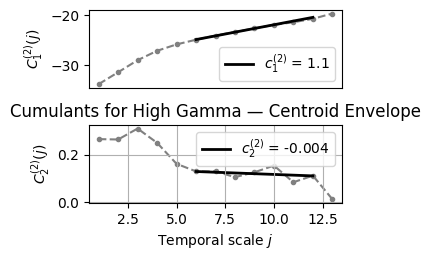

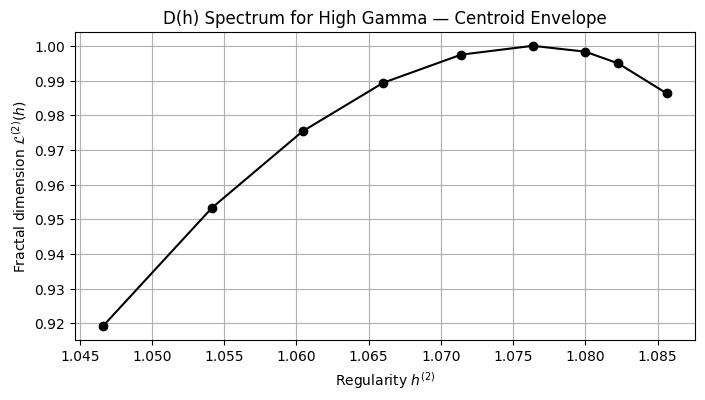


📊 Processing kmeans_cluster = 4


<Figure size 800x400 with 0 Axes>

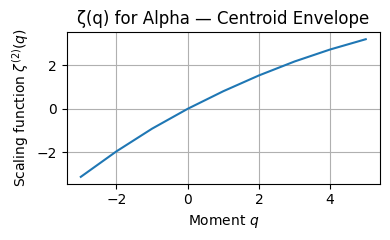

<Figure size 800x400 with 0 Axes>

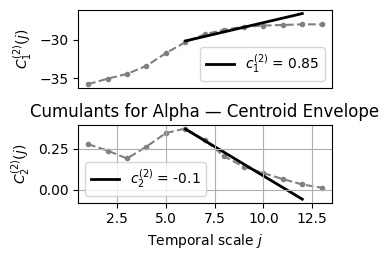

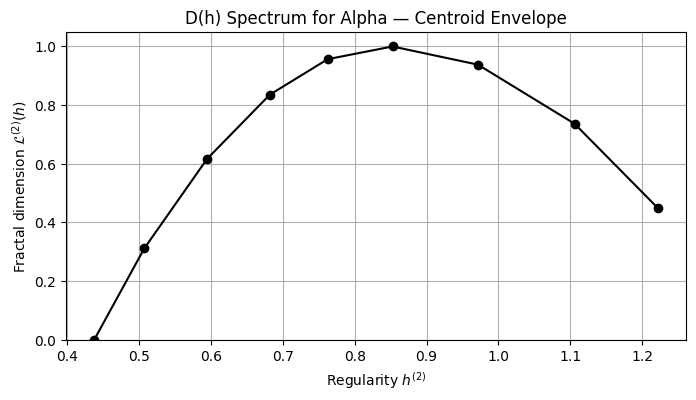


📊 Processing kmeans_cluster = 5


<Figure size 800x400 with 0 Axes>

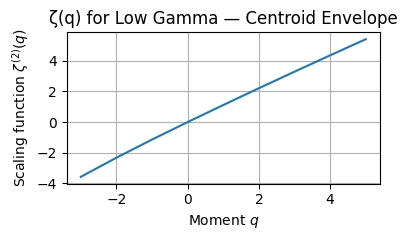

<Figure size 800x400 with 0 Axes>

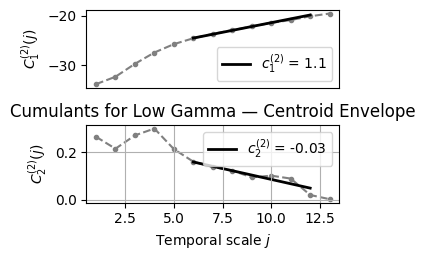

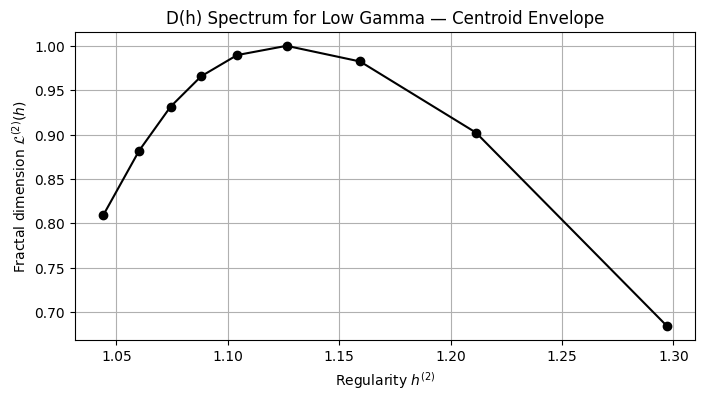

In [51]:
summary_df = mfa_on_envelope_centroids(modes_df,scaling_ranges,q_vals,output_base)


In [115]:
# from scipy.cluster.hierarchy import linkage, fcluster
# from scipy.spatial.distance import squareform

# def mfa_on_correlated_subgroups(cluster_corrs, cluster_envelope, scaling_ranges, q_vals, output_dir=None):
#     """
#     Perform MFA on subgroups of correlated envelopes inside each cluster.
    
#     Parameters:
#     - cluster_corrs: dict of correlation matrices per cluster (key = cluster_id)
#     - cluster_envelope: dict of list of envelopes per cluster (key = cluster_id)
#     - scaling_ranges: list of scale tuples [(j1, j2)] for MFA
#     - q_vals: array of q values
#     - threshold: correlation threshold (default: 0.7)
#     - output_dir: optional path to save plots
    
#     Returns:
#     - summary_df: DataFrame with log-cumulants for each correlated subgroup
#     """

#     summary_records = []

#     for clust_id in sorted(cluster_corrs.keys()):
#         print(f"\n🔍 Cluster {clust_id}:")

#         corr_mat = cluster_corrs[clust_id]
#         envelopes = cluster_envelope[clust_id]

#         # Convert correlation to distance
#         dist_mat = 1 - corr_mat
#         dist_condensed = squareform(dist_mat, checks=False)

#         # Hierarchical clustering
#         Z = linkage(dist_condensed, method='average')
#         n_clusters = min(2, len(envelopes))  # never create more than 3 subgroups
#         subgroup_labels = fcluster(Z, t=n_clusters, criterion='maxclust')

#         n_subgroups = np.max(subgroup_labels)
#         print(f"  → Found {n_subgroups} correlated subgroups")

#         for subgroup_id in range(1, n_subgroups + 1):
#             subgroup_indices = np.where(subgroup_labels == subgroup_id)[0]
#             subgroup_envelopes = [envelopes[i] for i in subgroup_indices]

#             if len(subgroup_envelopes) < 2:
#                 print("len of ",subgroup_id, clust_id, "is less than 2")
#                 continue  # skip tiny subgroups

#             centroid = np.mean(np.stack(subgroup_envelopes), axis=0)

#             try:
#                 pwt = compute_mfa(centroid, scaling_ranges, q_vals)
                
#                 # Optional: plot MFA results
#                 if output_dir:
#                     plt.figure(figsize=(8, 4))
#                     pwt.structure.plot_scaling()
#                     plt.title(f"ζ(q) | Cluster {clust_id} Subgroup {subgroup_id}")
#                     plt.grid()
#                     plt.savefig(os.path.join(output_dir, f"cluster{clust_id}_sub{subgroup_id}_zeta.png"))
#                     plt.close()

#                     plt.figure(figsize=(8, 4))
#                     pwt.cumulants.plot()
#                     plt.title(f"Cumulants | Cluster {clust_id} Subgroup {subgroup_id}")
#                     plt.grid()
#                     plt.savefig(os.path.join(output_dir, f"cluster{clust_id}_sub{subgroup_id}_cumulants.png"))
#                     plt.close()

#                     plt.figure(figsize=(8, 4))
#                     pwt.spectrum.plot()
#                     plt.title(f"D(h) Spectrum | Cluster {clust_id} Subgroup {subgroup_id}")
#                     plt.grid()
#                     plt.savefig(os.path.join(output_dir, f"cluster{clust_id}_sub{subgroup_id}_spectrum.png"))
#                     plt.close()

#                 summary_records.append({
#                     "Cluster": clust_id,
#                     "Subgroup": subgroup_id,
#                     "N modes": len(subgroup_envelopes),
#                     "Log-cumulant 1": pwt.cumulants.values[0],
#                     "Log-cumulant 2": pwt.cumulants.values[1]
#                 })

#             except Exception as e:
#                 print(f"❌ MFA failed for Cluster {clust_id} Subgroup {subgroup_id}: {e}")
#                 continue

#     summary_df = pd.DataFrame(summary_records)
#     if output_dir:
#         summary_df.to_csv(os.path.join(output_dir, "mfa_correlated_subgroups_summary.csv"), index=False)
#         print(f"\n✅ Summary saved to {output_dir}/mfa_correlated_subgroups_summary.csv")

#     return summary_df

# summary = mfa_on_correlated_subgroups(
#     cluster_corrs=cluster_corrs,
#     cluster_envelope=cluster_envelope,
#     scaling_ranges=[(6, 11)],
#     q_vals=np.arange(-2, 2.1, 0.1),
#     output_dir = os.path.join(output_base, "figures", "subgroups_mfa")
# )


# Notes to improve presentation 

* Slide 1 : Brain Criticality + Scale invariance + The relation between brain crticality and scale invariance 
* Justification des méthodes avant vmd/mvmd